# Dataset Tomates



In [1]:
import os
import glob
import yaml

print("🤖 VcBot: Ejecutando descarga directa...")

# 1. TU COMANDO DE DESCARGA (Ejecutado desde Python)
# El '!' ejecuta comandos de terminal en Colab
!curl -L --progress-bar "https://public.roboflow.com/ds/DbE0ZbY5of?key=bo33twU9mJ" > dataset.zip; unzip -qo dataset.zip; rm dataset.zip

print("\n✅ Descarga y descompresión finalizada.")

# 2. REPORTE DE ESTRUCTURA Y CONTEO
print(f"\n📊 REPORTE DEL DATASET DESCARGADO")
print("-" * 50)

# Roboflow suele descomprimir en la raiz './'
base_path = "."
carpetas = ['train', 'valid', 'test']
total_imgs = 0
found_yaml = False

for carpeta in carpetas:
    # Ruta estándar YOLO: ./train/images
    ruta_imgs = os.path.join(base_path, carpeta, 'images')

    # Si no está en 'images', buscamos en la raíz de la carpeta (./train)
    if not os.path.exists(ruta_imgs):
        ruta_imgs = os.path.join(base_path, carpeta)

    if os.path.exists(ruta_imgs) and os.path.isdir(ruta_imgs):
        # Contamos extensiones típicas
        imgs = glob.glob(os.path.join(ruta_imgs, '*.jpg')) + \
               glob.glob(os.path.join(ruta_imgs, '*.jpeg')) + \
               glob.glob(os.path.join(ruta_imgs, '*.png'))

        n = len(imgs)
        total_imgs += n
        print(f"📁 {carpeta.upper()}:")
        print(f"   └── {n} imágenes en '{ruta_imgs}'")
    else:
        # A veces 'test' no existe, es normal
        if carpeta != 'test':
            print(f"⚠️ {carpeta.upper()}: No encontrada o vacía.")

print("-" * 50)
print(f"∑ TOTAL: {total_imgs} imágenes.")

# 3. BUSCAR Y ARREGLAR DATA.YAML (Crucial para entrenar)
print("\n🔧 ARREGLO DE CONFIGURACIÓN (data.yaml)")
yaml_files = glob.glob("data.yaml") + glob.glob("*.yaml")

if yaml_files:
    target_yaml = yaml_files[0]
    print(f"   Archivo encontrado: {target_yaml}")

    try:
        with open(target_yaml, 'r') as f:
            data = yaml.safe_load(f)

        # Arreglar rutas absolutas para Colab
        data['path'] = os.path.abspath(".") # Directorio actual
        data['train'] = "train/images"
        data['val'] = "valid/images"
        data['test'] = "test/images" # Si existe

        # Guardar cambios
        with open(target_yaml, 'w') as f:
            yaml.dump(data, f, default_flow_style=False)

        print("   ✅ Rutas corregidas exitosamente en data.yaml")
        print("   (Ya está listo para entrenar con YOLOv8)")
    except Exception as e:
        print(f"   ❌ Error leyendo yaml: {e}")
else:
    print("   ❌ No se encontró archivo .yaml en la raíz.")

# 4. MOSTRAR ÁRBOL DE CARPETAS (Resumen)
print("\n🌳 ESTRUCTURA VISUAL:")
print("ROOT (./)")
for item in os.listdir('.'):
    if os.path.isdir(item) and item in ['train', 'valid', 'test']:
        print(f"├── 📂 {item}/")
        if os.path.exists(f"{item}/images"):
            print(f"│   ├── 📂 images/ ({len(os.listdir(f'{item}/images'))} archivos)")
        if os.path.exists(f"{item}/labels"):
            print(f"│   ├── 📂 labels/ ({len(os.listdir(f'{item}/labels'))} archivos)")
    elif item.endswith('.yaml'):
        print(f"├── 📄 {item}")

🤖 VcBot: Ejecutando descarga directa...
######################################################################## 100.0%

✅ Descarga y descompresión finalizada.

📊 REPORTE DEL DATASET DESCARGADO
--------------------------------------------------
📁 TRAIN:
   └── 2328 imágenes en './train/images'
⚠️ VALID: No encontrada o vacía.
📁 TEST:
   └── 239 imágenes en './test/images'
--------------------------------------------------
∑ TOTAL: 2567 imágenes.

🔧 ARREGLO DE CONFIGURACIÓN (data.yaml)
   Archivo encontrado: data.yaml
   ✅ Rutas corregidas exitosamente en data.yaml
   (Ya está listo para entrenar con YOLOv8)

🌳 ESTRUCTURA VISUAL:
ROOT (./)
├── 📂 train/
│   ├── 📂 images/ (2328 archivos)
│   ├── 📂 labels/ (2328 archivos)
├── 📄 data.yaml
├── 📂 test/
│   ├── 📂 images/ (239 archivos)
│   ├── 📂 labels/ (239 archivos)


🤖 VcBot: Iniciando análisis forense del dataset...
✅ Clases detectadas (30): ['Apple Scab Leaf', 'Apple leaf', 'Apple rust leaf', 'Bell_pepper leaf spot', 'Bell_pepper leaf', 'Blueberry leaf', 'Cherry leaf', 'Corn Gray leaf spot', 'Corn leaf blight', 'Corn rust leaf', 'Peach leaf', 'Potato leaf early blight', 'Potato leaf late blight', 'Potato leaf', 'Raspberry leaf', 'Soyabean leaf', 'Soybean leaf', 'Squash Powdery mildew leaf', 'Strawberry leaf', 'Tomato Early blight leaf', 'Tomato Septoria leaf spot', 'Tomato leaf bacterial spot', 'Tomato leaf late blight', 'Tomato leaf mosaic virus', 'Tomato leaf yellow virus', 'Tomato leaf', 'Tomato mold leaf', 'Tomato two spotted spider mites leaf', 'grape leaf black rot', 'grape leaf']

📊 Contando objetos en las etiquetas (esto puede tardar un poco)...

📋 RECUENTO DE OBJETOS:
CLASE                | CANTIDAD  
-----------------------------------
Blueberry leaf       | 838       
Tomato leaf          | 801       
Peach leaf           | 589       


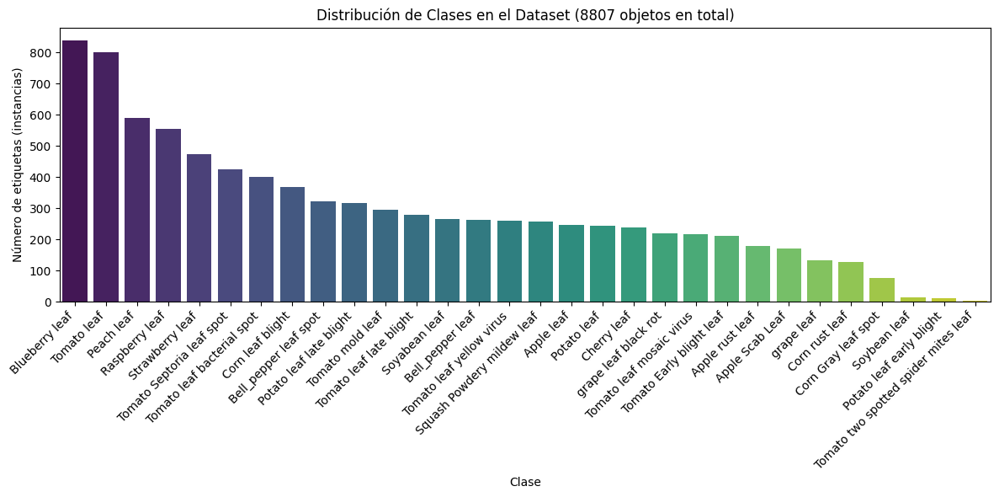


👁️ Mostrando ejemplos visuales aleatorios...


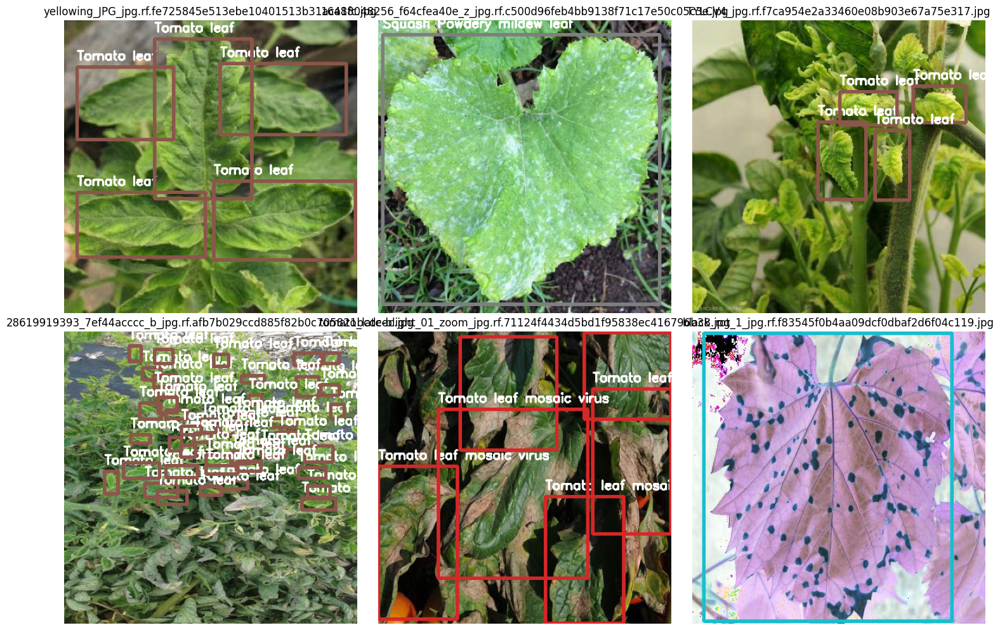

In [2]:
import os
import glob
import yaml
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import random
import numpy as np
from collections import Counter

print("🤖 VcBot: Iniciando análisis forense del dataset...")

# --- PASO 1: CARGAR CONFIGURACIÓN (CLASES) ---
yaml_files = glob.glob("data.yaml") + glob.glob("*.yaml")

if not yaml_files:
    print("❌ ERROR: No encuentro el archivo data.yaml. Asegúrate de haber descargado el dataset.")
else:
    target_yaml = yaml_files[0]
    with open(target_yaml, 'r') as f:
        data = yaml.safe_load(f)

    # Obtener nombres de las clases
    class_names = data.get('names', [])
    # A veces 'names' es un dict {0: 'tomate', 1: 'hoja'}, a veces una lista ['tomate', 'hoja']
    if isinstance(class_names, dict):
        class_names = [class_names[i] for i in sorted(class_names.keys())]

    print(f"✅ Clases detectadas ({len(class_names)}): {class_names}")

    # --- PASO 2: CONTAR INSTANCIAS POR CLASE (Histograma) ---
    print("\n📊 Contando objetos en las etiquetas (esto puede tardar un poco)...")

    class_counts = Counter()

    # Buscamos en todas las carpetas de labels (train, valid, test)
    label_files = glob.glob('./**/labels/**/*.txt', recursive=True)

    for lfile in label_files:
        with open(lfile, 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 5: # Formato YOLO válido
                    class_id = int(parts[0])
                    # Verificamos que el ID esté dentro del rango
                    if 0 <= class_id < len(class_names):
                        class_counts[class_names[class_id]] += 1

    # Mostrar tabla de texto
    print("\n📋 RECUENTO DE OBJETOS:")
    print(f"{'CLASE':<20} | {'CANTIDAD':<10}")
    print("-" * 35)
    for cls, count in class_counts.most_common():
        print(f"{cls:<20} | {count:<10}")

    # Generar Gráfico (Histograma)
    if class_counts:
        plt.figure(figsize=(12, 6))
        # Ordenamos para que se vea bonito
        sorted_items = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)
        keys = [k for k, v in sorted_items]
        vals = [v for k, v in sorted_items]

        sns.barplot(x=keys, y=vals, hue=keys, legend=False, palette="viridis")
        plt.title(f"Distribución de Clases en el Dataset ({sum(vals)} objetos en total)")
        plt.xlabel("Clase")
        plt.ylabel("Número de etiquetas (instancias)")
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()
    else:
        print("⚠️ No se encontraron etiquetas válidas para generar el histograma.")

    # --- PASO 3: VISUALIZACIÓN DE IMÁGENES (Muestreo) ---
    print("\n👁️ Mostrando ejemplos visuales aleatorios...")

    # Buscamos imágenes
    all_images = glob.glob('./**/images/**/*.jpg', recursive=True) + \
                 glob.glob('./**/images/**/*.png', recursive=True)

    if all_images:
        num_samples = 6
        samples = random.sample(all_images, min(len(all_images), num_samples))

        plt.figure(figsize=(15, 10))

        for i, img_path in enumerate(samples):
            img = cv2.imread(img_path)
            if img is None: continue
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            h, w, _ = img.shape

            # Buscar etiqueta correspondiente
            # Asumimos estructura estándar YOLO: .../images/x.jpg -> .../labels/x.txt
            label_path = img_path.replace('images', 'labels').rsplit('.', 1)[0] + ".txt"

            # Si no está ahí, intento búsqueda "inteligente" en la misma carpeta padre
            if not os.path.exists(label_path):
                 parent = os.path.dirname(os.path.dirname(img_path)) # Subir nivel
                 fname = os.path.basename(img_path).rsplit('.', 1)[0] + ".txt"
                 found = glob.glob(f"{parent}/**/{fname}", recursive=True)
                 if found: label_path = found[0]

            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    for line in f.readlines():
                        parts = line.strip().split()
                        cls_id = int(parts[0])
                        cx, cy, bw, bh = map(float, parts[1:])

                        # Coordenadas pixel
                        x1 = int((cx - bw/2) * w)
                        y1 = int((cy - bh/2) * h)
                        x2 = int((cx + bw/2) * w)
                        y2 = int((cy + bh/2) * h)

                        # Color dinámico basado en la clase
                        color = plt.cm.tab10(cls_id % 10)
                        color = (int(color[0]*255), int(color[1]*255), int(color[2]*255))

                        cv2.rectangle(img, (x1, y1), (x2, y2), color, 3)

                        label_text = class_names[cls_id] if 0 <= cls_id < len(class_names) else str(cls_id)
                        cv2.putText(img, label_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)

            plt.subplot(2, 3, i+1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(os.path.basename(img_path))

        plt.tight_layout()
        plt.show()
    else:
        print("❌ No encontré imágenes para mostrar.")

## Pruebas yolo 30%

In [4]:
%pip install ultralytics
import ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 41.1 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [17]:
# CONFIGURACIÓN
MINI_DIR = os.path.abspath("yolo_mini_benchmark") # Ruta absoluta para evitar errores
SEARCH_ROOT = "/content/drive/MyDrive/" # Cambia esto a "/content/drive/MyDrive/..." si tus datos están en Drive
FRACTION = 0.30   # Porcentaje de datos a usar

print(f"🤖 VcBot: Buscando datasets en '{SEARCH_ROOT}' para crear el Mini-Dataset...")

# 1. Limpiar directorio anterior si existe
if os.path.exists(MINI_DIR):
    shutil.rmtree(MINI_DIR)

# Crear estructura de carpetas
for split in ['train', 'val']:
    os.makedirs(os.path.join(MINI_DIR, split, 'images'), exist_ok=True)
    os.makedirs(os.path.join(MINI_DIR, split, 'labels'), exist_ok=True)

# 2. Buscar data.yaml original (ignorando el del mini)
yaml_candidates = glob.glob(os.path.join(SEARCH_ROOT, "**", "data.yaml"), recursive=True)
yaml_candidates = [f for f in yaml_candidates if "mini" not in f]

if not yaml_candidates:
    raise FileNotFoundError("❌ No encontré ningún archivo data.yaml. Verifica la ruta.")

original_yaml = yaml_candidates[0]
print(f"   📄 Configuración original encontrada en: {original_yaml}")

# Leer nombres de clases para replicarlos
with open(original_yaml, 'r') as f:
    data_config = yaml.safe_load(f)

# 3. Función de Copia Inteligente
def create_subset(split_name):
    # Busca imágenes jpg, png, jpeg (insensible a mayúsculas)
    extensions = ['*.jpg', '*.jpeg', '*.png', '*.JPG', '*.PNG']
    possible_images = []

    for ext in extensions:
        # Busca recursivamente en carpetas que coincidan con el split (train/val)
        found = glob.glob(os.path.join(SEARCH_ROOT, "**", split_name, "**", "images", ext), recursive=True)
        possible_images.extend(found)

    # Eliminar duplicados y rutas del propio mini
    possible_images = list(set([img for img in possible_images if "mini" not in img]))

    if len(possible_images) > 0:
        subset_size = max(int(len(possible_images) * FRACTION), 10) # Mínimo 10 fotos
        subset = random.sample(possible_images, min(len(possible_images), subset_size))

        print(f"   📂 {split_name.upper()}: Copiando {len(subset)} imágenes (de {len(possible_images)} disponibles).")

        for img_path in subset:
            # Copiar Imagen
            file_name = os.path.basename(img_path)
            dst_img = os.path.join(MINI_DIR, split_name, 'images', file_name)
            shutil.copy(img_path, dst_img)

            # Buscar Label (txt)
            # Asumimos estructura standard: .../images/foto.jpg -> .../labels/foto.txt
            label_path = img_path.replace('images', 'labels').rsplit('.', 1)[0] + ".txt"

            # Si no está en la ruta estándar, búsqueda de rescate
            if not os.path.exists(label_path):
                parent = os.path.dirname(os.path.dirname(img_path)) # Subir 2 niveles
                txt_name = os.path.splitext(file_name)[0] + ".txt"
                found_txt = glob.glob(os.path.join(parent, "**", txt_name), recursive=True)
                if found_txt: label_path = found_txt[0]

            if os.path.exists(label_path):
                dst_lbl = os.path.join(MINI_DIR, split_name, 'labels', os.path.basename(label_path))
                shutil.copy(label_path, dst_lbl)

    else:
        print(f"   ⚠️ No se encontraron imágenes para el split '{split_name}'")

# Ejecutar copiado
create_subset('train')
# Intentamos buscar 'val' o 'valid' por si el dataset usa nombres distintos
create_subset('val')
create_subset('valid')

# 4. Crear data.yaml nuevo con rutas absolutas
mini_yaml_content = {
    'path': MINI_DIR,
    'train': 'train/images',
    'val': 'val/images',
    'nc': data_config.get('nc', 1),
    'names': data_config.get('names', ['object'])
}

mini_yaml_path = os.path.join(MINI_DIR, "data.yaml")
with open(mini_yaml_path, 'w') as f:
    yaml.dump(mini_yaml_content, f)

print(f"✅ Mini-Dataset listo en: {MINI_DIR}")
print(f"📄 Nuevo YAML en: {mini_yaml_path}")

🤖 VcBot: Buscando datasets en '/content/drive/MyDrive/' para crear el Mini-Dataset...
   📄 Configuración original encontrada en: /content/drive/MyDrive/Colab Notebooks/PlantDoc.v2-resize-100x100.yolov7pytorch/data.yaml
   📂 TRAIN: Copiando 698 imágenes (de 2329 disponibles).
   ⚠️ No se encontraron imágenes para el split 'val'
   ⚠️ No se encontraron imágenes para el split 'valid'
✅ Mini-Dataset listo en: /content/yolo_mini_benchmark
📄 Nuevo YAML en: /content/yolo_mini_benchmark/data.yaml


In [19]:
import torch
import gc
from ultralytics import YOLO

print("\n🔥 PASO 2: Iniciando Torneo de Modelos...")

# LISTA DE COMPETIDORES
models_to_test = [
    'yolov8n.pt',  # V8 Nano
    'yolo11n.pt',  # V11 Nano
    'yolov8m.pt',  # V8 Medium
    'yolo11m.pt'   # V11 Medium
]

results_data = []
# Apunta al yaml creado en el paso 1
DATA_YAML = '/content/yolo_mini/data.yaml'

for model_name in models_to_test:
    print(f"\n🔥 ENTRENANDO: {model_name} ...")

    # --- LIMPIEZA DE MEMORIA GPU (IMPORTANTE) ---
    gc.collect()
    torch.cuda.empty_cache()
    # --------------------------------------------

    try:
        # 1. Cargar modelo
        model = YOLO(model_name)

        # 2. Entrenar
        # batch=8 para que los modelos Medium no saturen la memoria
        model.train(
            data=DATA_YAML,
            epochs=20,
            imgsz=640,
            batch=8,
            device=0 if torch.cuda.is_available() else 'cpu',
            project='benchmark_results',
            name=model_name.replace('.pt', ''),
            verbose=False,
            plots=False
        )

        # 3. Guardar métricas clave
        metrics = model.val(split='val', verbose=False)

        map50 = metrics.box.map50       # Precisión general
        map50_95 = metrics.box.map     # Precisión fina
        speed = metrics.speed['inference'] + metrics.speed['preprocess'] + metrics.speed['loss']

        results_data.append({
            'Modelo': model_name.replace('.pt', ''),
            'mAP50': map50,
            'mAP50-95 (Alta Precisión)': map50_95,
            'Velocidad (ms)': speed,
            'Versión': 'v11' if '11' in model_name else 'v8',
            'Tamaño': 'Medium' if 'm.pt' in model_name else 'Nano'
        })

        print(f"   ✅ {model_name}: mAP={map50_95:.3f} | Vel={speed:.1f}ms")

    except Exception as e:
        print(f"   ❌ Falló el modelo {model_name}: {e}")

print("\n🏁 ¡TORNEO FINALIZADO!")


🔥 PASO 2: Iniciando Torneo de Modelos...

🔥 ENTRENANDO: yolov8n.pt ...
Ultralytics 8.3.245 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_mini/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8n3, nbs=64, nms=False, opset=None, optimize=False, optimizer=aut


📋 TABLA DE POSICIONES:
       Modelo  Tamaño Versión  mAP50-95  Velocidad (ms)  Params (M)
2  yolov8s.pt   Small      v8  0.468841       14.411305   11.127519
4  yolov8m.pt  Medium      v8  0.463442       24.879724   25.842655
3  yolo11s.pt   Small     v11  0.455815       12.996951    9.414735
1  yolo11n.pt    Nano     v11  0.451746        7.777116    2.583127
0  yolov8n.pt    Nano      v8  0.442865        8.017031    3.006623
5  yolo11m.pt  Medium     v11  0.440653       28.643166   20.033887


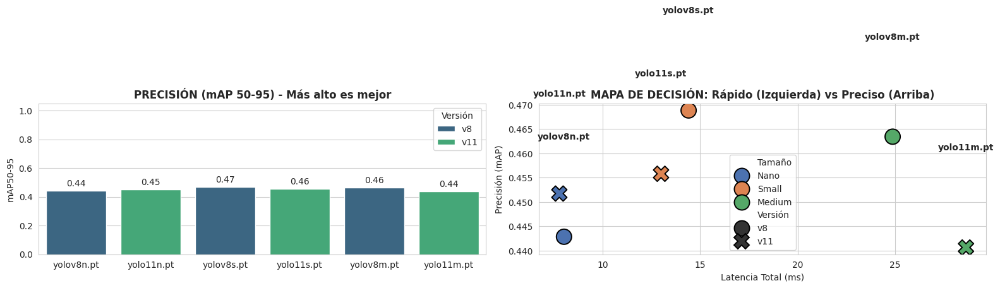

--------------------------------------------------
🏆 GANADOR EN PRECISIÓN: yolov8s.pt (mAP: 0.469)
⚡ GANADOR EN VELOCIDAD: yolo11n.pt (7.8 ms)
--------------------------------------------------


In [21]:
if len(results_data) > 0:
    df = pd.DataFrame(results_data)

    # 1. Tabla de Texto
    print("\n📋 TABLA DE POSICIONES:")
    print(df.sort_values(by='mAP50-95', ascending=False))

    # Configuración de estilo
    sns.set_style("whitegrid")
    plt.figure(figsize=(16, 6))

    # --- GRÁFICA 1: PRECISIÓN (BARRAS) ---
    plt.subplot(1, 2, 1)
    ax = sns.barplot(data=df, x='Modelo', y='mAP50-95', hue='Versión', palette='viridis', dodge=False)
    plt.title("PRECISIÓN (mAP 50-95) - Más alto es mejor", fontsize=12, fontweight='bold')
    plt.ylim(0, 1.05)
    plt.xlabel("")

    # Poner el valor encima de la barra
    for i in ax.containers:
        ax.bar_label(i, fmt='%.2f', padding=3)

    # --- GRÁFICA 2: MAPA DE DECISIÓN (SCATTER) ---
    plt.subplot(1, 2, 2)
    sns.scatterplot(
        data=df,
        x='Velocidad (ms)',
        y='mAP50-95',
        hue='Tamaño',
        style='Versión',
        s=300, # Puntos grandes
        palette='deep',
        edgecolor='black'
    )

    # Etiquetas de texto mejor posicionadas
    for i in range(df.shape[0]):
        plt.text(
            df['Velocidad (ms)'][i],
            df['mAP50-95'][i] + 0.02, # Un poco más arriba del punto
            df['Modelo'][i],
            fontsize=10,
            fontweight='bold',
            ha='center'
        )

    plt.title("MAPA DE DECISIÓN: Rápido (Izquierda) vs Preciso (Arriba)", fontsize=12, fontweight='bold')
    plt.xlabel("Latencia Total (ms)")
    plt.ylabel("Precisión (mAP)")

    plt.tight_layout()
    plt.show()

    # --- RECOMENDACIÓN FINAL ---
    best_acc = df.sort_values(by='mAP50-95', ascending=False).iloc[0]
    best_speed = df.sort_values(by='Velocidad (ms)', ascending=True).iloc[0]

    print("-" * 50)
    print(f"🏆 GANADOR EN PRECISIÓN: {best_acc['Modelo']} (mAP: {best_acc['mAP50-95']:.3f})")
    print(f"⚡ GANADOR EN VELOCIDAD: {best_speed['Modelo']} ({best_speed['Velocidad (ms)']:.1f} ms)")
    print("-" * 50)

else:
    print("❌ No hay resultados para mostrar. Revisa si hubo errores en el paso 2.")

## Pruebas con Dataset Completo

🤖 VcBot: Iniciando REPARACIÓN DE RUTAS y TORNEO...
✅ Imágenes localizadas en: /content
⚠️ No encontré carpeta 'valid' o 'val'. Usaré 'train' para validar.
🔧 Archivo de configuración arreglado: /content/fixed_data.yaml
   - Train: /content/train/images
   - Val:   /content/train/images

🔥 ENTRENANDO: yolov8n.pt ...
Ultralytics 8.3.245 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/fixed_data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=Fal

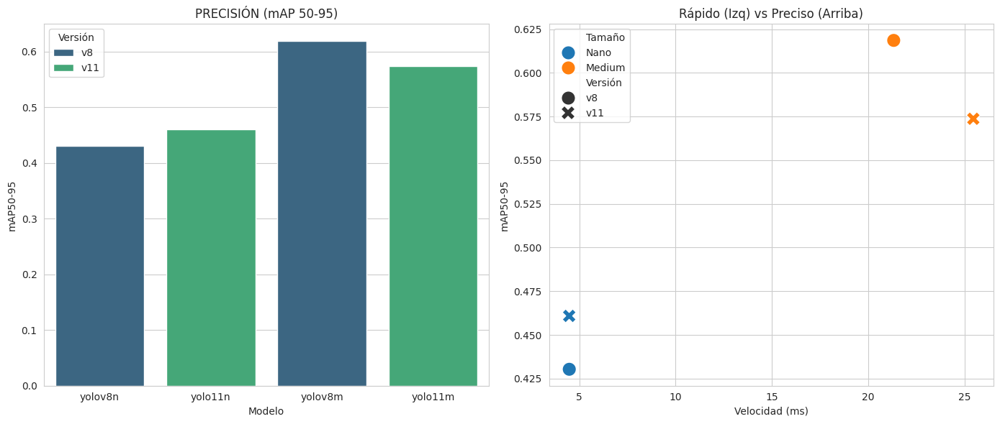

In [28]:
import os
import glob
import yaml
import torch
import gc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from ultralytics import YOLO

print("🤖 VcBot: Iniciando REPARACIÓN DE RUTAS y TORNEO...")

# ==============================================================================
# 1. AUTODETECCIÓN Y REPARACIÓN DE RUTAS
# ==============================================================================
# Buscamos dónde demonios están las imágenes 'train'
candidates_train = glob.glob("/content/**/train/images", recursive=True)

if not candidates_train:
    raise FileNotFoundError("❌ ¡SOCORRO! No encuentro ninguna carpeta 'train/images' en todo Colab. Vuelve a descargar el dataset.")

# Tomamos la primera coincidencia (normalmente la correcta)
real_train_path = os.path.abspath(candidates_train[0])
base_dir = os.path.dirname(os.path.dirname(real_train_path)) # Subimos 2 niveles para llegar a la raíz del dataset

print(f"✅ Imágenes localizadas en: {base_dir}")

# Buscamos la carpeta de validación (a veces se llama 'valid', a veces 'val')
real_val_path = None
if os.path.exists(os.path.join(base_dir, "valid", "images")):
    real_val_path = os.path.abspath(os.path.join(base_dir, "valid", "images"))
elif os.path.exists(os.path.join(base_dir, "val", "images")):
    real_val_path = os.path.abspath(os.path.join(base_dir, "val", "images"))
else:
    # Si no hay validación, usamos train como validación (parche de emergencia)
    print("⚠️ No encontré carpeta 'valid' o 'val'. Usaré 'train' para validar.")
    real_val_path = real_train_path

# Buscamos el data.yaml original para leer los nombres de las clases
yaml_files = glob.glob(os.path.join(base_dir, "data.yaml")) + glob.glob("/content/data.yaml")
if yaml_files:
    with open(yaml_files[0], 'r') as f:
        old_data = yaml.safe_load(f)
        names = old_data.get('names', ['object'])
        nc = old_data.get('nc', 1)
else:
    names = ['object']
    nc = 1

# ESCRIBIMOS EL NUEVO YAML CON RUTAS ABSOLUTAS (A PRUEBA DE BALAS)
fixed_yaml_path = "/content/fixed_data.yaml"
new_content = {
    'path': base_dir,
    'train': real_train_path,
    'val': real_val_path,
    'nc': nc,
    'names': names
}

with open(fixed_yaml_path, 'w') as f:
    yaml.dump(new_content, f)

print(f"🔧 Archivo de configuración arreglado: {fixed_yaml_path}")
print(f"   - Train: {real_train_path}")
print(f"   - Val:   {real_val_path}")


# ==============================================================================
# 2. EL TORNEO (Usando el YAML arreglado)
# ==============================================================================
models_to_test = [
    'yolov8n.pt',  # V8 Nano
    'yolo11n.pt',  # V11 Nano
    'yolov8m.pt',  # V8 Medium
    'yolo11m.pt'   # V11 Medium
]

results_data = []
device = 0 if torch.cuda.is_available() else 'cpu'

for model_name in models_to_test:
    print(f"\n🔥 ENTRENANDO: {model_name} ...")

    # Limpieza de memoria
    gc.collect()
    torch.cuda.empty_cache()

    try:
        model = YOLO(model_name)

        # Batch: 16 para Nano, 8 para Medium
        bs = 8 if 'm.pt' in model_name else 16

        model.train(
            data=fixed_yaml_path,  # <--- USAMOS EL YAML ARREGLADO
            epochs=20,
            imgsz=640,
            batch=bs,
            device=device,
            project='benchmark_fixed',
            name=model_name.replace('.pt', ''),
            verbose=False,
            plots=False
        )

        metrics = model.val(split='val', verbose=False)

        # Datos
        map50_95 = metrics.box.map
        speed = metrics.speed['inference'] + metrics.speed['preprocess'] + metrics.speed['loss']
        n_params = sum(p.numel() for p in model.parameters()) / 1e6

        results_data.append({
            'Modelo': model_name.replace('.pt', ''),
            'mAP50-95': map50_95,
            'Velocidad (ms)': speed,
            'Versión': 'v11' if '11' in model_name else 'v8',
            'Tamaño': 'Medium' if 'm.pt' in model_name else 'Nano',
            'Params (M)': n_params
        })

        print(f"   ✅ Éxito: mAP={map50_95:.4f}")

    except Exception as e:
        print(f"   ❌ Error crítico en {model_name}: {e}")

# ==============================================================================
# 3. RESULTADOS
# ==============================================================================
print("\n🏁 TORNEO FINALIZADO.")

if len(results_data) > 0:
    df = pd.DataFrame(results_data)

    print("\n📋 TABLA FINAL:")
    print(df.sort_values(by='mAP50-95', ascending=False))

    # Gráficas
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    #
    sns.barplot(data=df, x='Modelo', y='mAP50-95', hue='Versión', palette='viridis')
    plt.title("PRECISIÓN (mAP 50-95)")

    plt.subplot(1, 2, 2)
    #
    sns.scatterplot(data=df, x='Velocidad (ms)', y='mAP50-95', hue='Tamaño', style='Versión', s=200)
    plt.title("Rápido (Izq) vs Preciso (Arriba)")

    plt.tight_layout()
    plt.show()
else:
    print("❌ No se pudo completar ningún entrenamiento.")

# Dataset Manzanas



🤖 VcBot: Buscando carpetas en singular (image/label)...
Mounted at /content/drive
✅ Dataset localizado en: /content/drive/MyDrive/Colab Notebooks/AppleTreeLeafDisease

📊 RECUENTO DE IMÁGENES POR CLASE
   🍏 Clase: 'Rust' -> 344 fotos.
   🍏 Clase: 'Gray_Spot' -> 395 fotos.
   🍏 Clase: 'Brown_Spot' -> 215 fotos.
   🍏 Clase: 'Alternaria_Leaf_Spot' -> 278 fotos.
   🍏 Clase: 'Healthy_Leaf' -> 409 fotos.


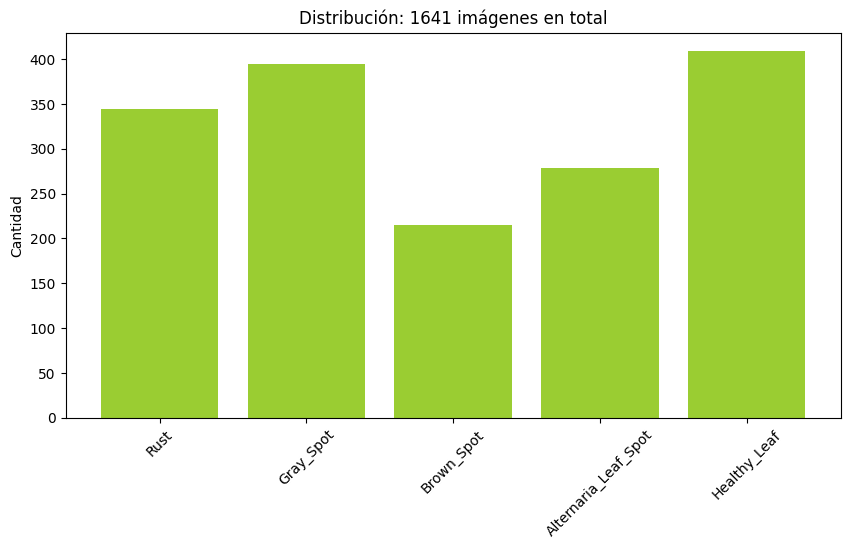


👁️ COMPARATIVA VISUAL (Original vs Label)


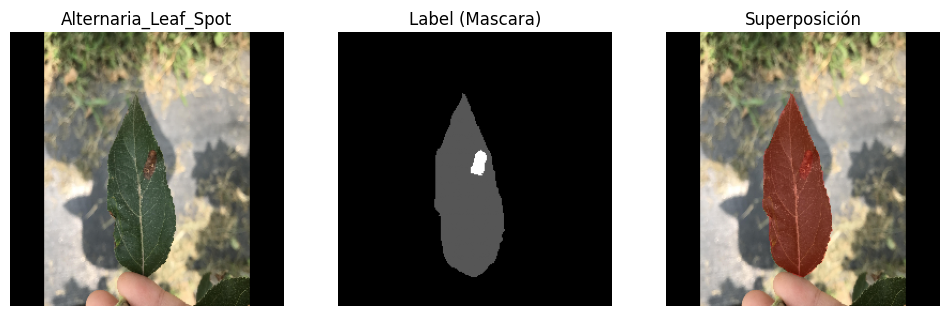

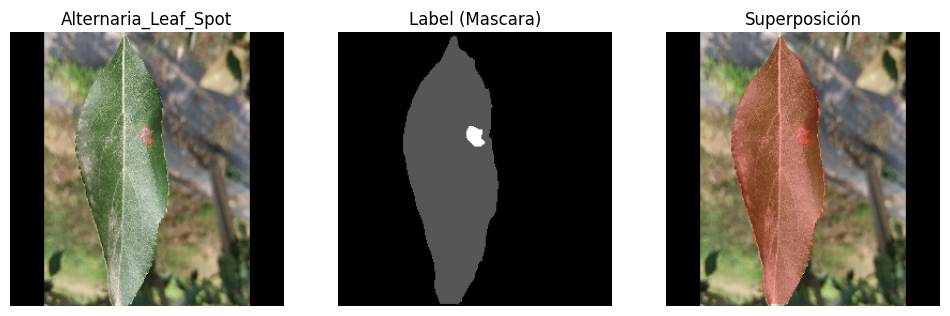

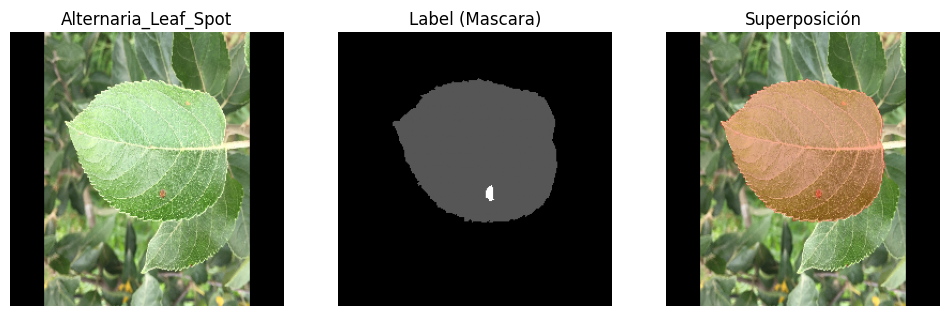

In [6]:
from google.colab import drive
import os
import glob
import cv2
import matplotlib.pyplot as plt
import random
import numpy as np

print("🤖 VcBot: Buscando carpetas en singular (image/label)...")

# 1. MONTAR DRIVE
if not os.path.exists('/content/drive'):
    drive.mount('/content/drive')

# 2. LOCALIZAR DATASET
search_path = "/content/drive/MyDrive"
# Buscamos la carpeta raiz del dataset
candidates = glob.glob(f'{search_path}/**/AppleTreeLeafDisease', recursive=True)

if not candidates:
    print("❌ ERROR: No encuentro la carpeta 'AppleTreeLeafDisease'.")
    dataset_root = None
else:
    dataset_root = candidates[0]
    print(f"✅ Dataset localizado en: {dataset_root}")

if dataset_root:
    # 3. ANÁLISIS DE CLASES (CONTANDO ARCHIVOS)
    print("\n📊 RECUENTO DE IMÁGENES POR CLASE")

    classes_found = {}

    # Recorremos todas las carpetas
    for root, dirs, files in os.walk(dataset_root):
        # BUSCAMOS LA CARPETA EXACTA "image" (Singular)
        if 'image' in dirs:
            # El nombre de la enfermedad es la carpeta donde estamos ahora
            disease_name = os.path.basename(root)

            # Ruta completa a las imágenes
            img_dir = os.path.join(root, 'image')

            # Contamos archivos
            images = glob.glob(f"{img_dir}/*.jpg") + \
                     glob.glob(f"{img_dir}/*.png") + \
                     glob.glob(f"{img_dir}/*.jpeg") + \
                     glob.glob(f"{img_dir}/*.JPG") # Por si acaso mayúsculas

            if len(images) > 0:
                classes_found[disease_name] = images
                print(f"   🍏 Clase: '{disease_name}' -> {len(images)} fotos.")

    # 4. GRÁFICO (HISTOGRAMA)
    if classes_found:
        names = list(classes_found.keys())
        counts = [len(v) for v in classes_found.values()]

        plt.figure(figsize=(10, 5))
        plt.bar(names, counts, color='yellowgreen')
        plt.title(f"Distribución: {sum(counts)} imágenes en total")
        plt.ylabel("Cantidad")
        plt.xticks(rotation=45)
        plt.show()

        # 5. VISUALIZACIÓN (FOTO vs MÁSCARA)
        print("\n👁️ COMPARATIVA VISUAL (Original vs Label)")

        # Elegimos clase aleatoria
        rnd_cls = random.choice(list(classes_found.keys()))
        img_list = classes_found[rnd_cls]

        # Mostramos 3 ejemplos
        samples = random.sample(img_list, min(len(img_list), 3))

        for i, img_path in enumerate(samples):
            # Leer imagen original
            img = cv2.imread(img_path)
            if img is None: continue
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # --- BUSCAR LA MÁSCARA (LABEL) ---
            # Truco: Reemplazamos '/image/' por '/label/' en la ruta
            # Usamos os.sep para que funcione sea cual sea el separador
            # Pero como estamos en Linux (Colab), es '/'

            # 1. Determinar carpeta de labels
            # Si la ruta es .../Rust/image/foto.jpg -> .../Rust/label/
            label_dir = os.path.dirname(img_path).replace('/image', '/label')

            # 2. Nombre del archivo (sin extensión)
            base_name = os.path.splitext(os.path.basename(img_path))[0]

            # 3. Buscar archivo en la carpeta label (puede ser .png aunque la foto sea .jpg)
            mask_path = None
            candidates_mask = glob.glob(f"{label_dir}/{base_name}.*")
            if candidates_mask:
                mask_path = candidates_mask[0]

            # --- DIBUJAR ---
            plt.figure(figsize=(12, 4))

            # Original
            plt.subplot(1, 3, 1)
            plt.imshow(img)
            plt.title(f"{rnd_cls}")
            plt.axis('off')

            if mask_path and os.path.exists(mask_path):
                # Leer Máscara
                mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

                # Máscara Sola
                plt.subplot(1, 3, 2)
                plt.imshow(mask, cmap='gray')
                plt.title("Label (Mascara)")
                plt.axis('off')

                # Superposición
                # Redimensionar si es necesario
                if mask.shape != img.shape[:2]:
                    mask = cv2.resize(mask, (img.shape[1], img.shape[0]))

                overlay = img.copy()
                # Pintar de rojo donde la máscara no sea negra (valor > 0)
                overlay[mask > 0] = [255, 0, 0]

                combined = cv2.addWeighted(img, 0.7, overlay, 0.3, 0)

                plt.subplot(1, 3, 3)
                plt.imshow(combined)
                plt.title("Superposición")
                plt.axis('off')
            else:
                plt.subplot(1, 3, 2)
                plt.text(0.5, 0.5, "SIN LABEL", ha='center')
                plt.title("Carpeta 'label' no encontrada o vacía")
                plt.axis('off')

            plt.show()

    else:
        print("❌ No encontré carpetas llamadas 'image'. Revisa si están escritas en minúsculas.")

🧪 PROBANDO LIMPIEZA DE COLORES EN 4 MÁSCARAS...


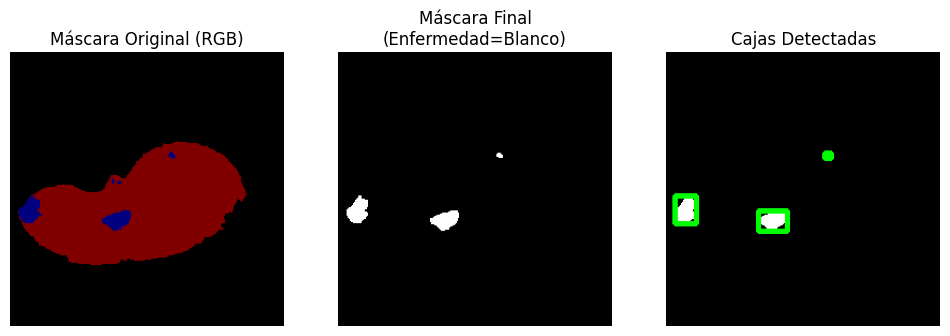

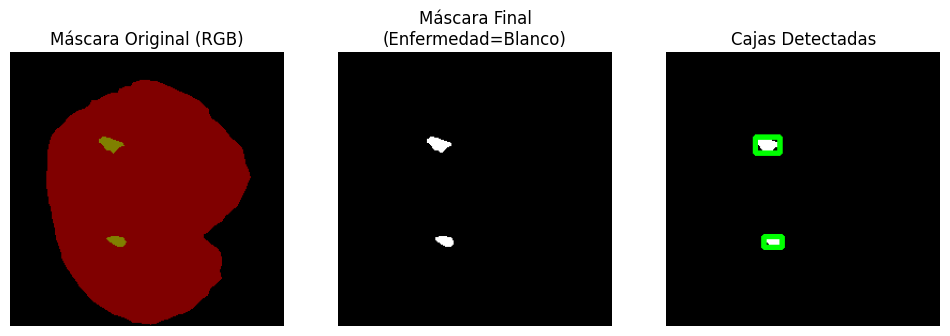

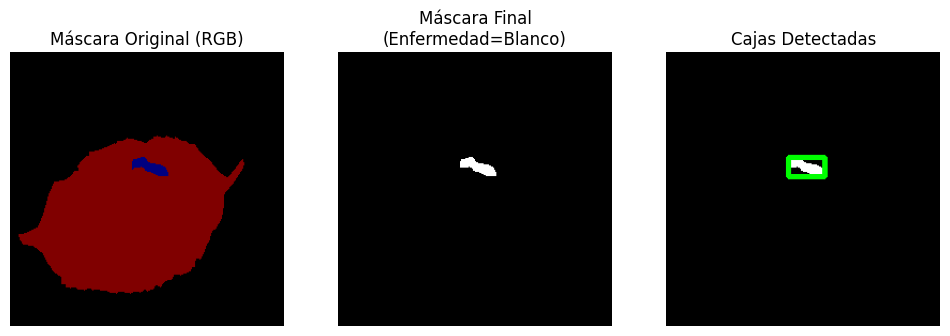

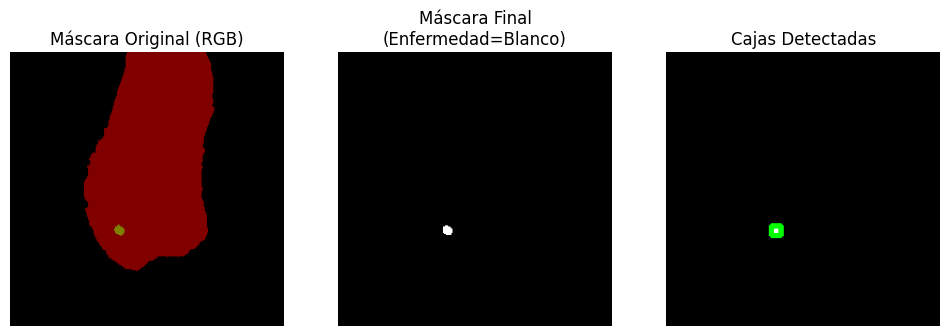

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import random
from google.colab import drive

class RGBMaskCleaner:
    def clean_mask(self, mask_rgb_path):
        # 1. Leer la máscara como imagen a COLOR (RGB/BGR)
        mask_bgr = cv2.imread(mask_rgb_path)
        if mask_bgr is None: return None

        # Convertir a HSV (Mejor para detectar el rojo exacto)
        hsv = cv2.cvtColor(mask_bgr, cv2.COLOR_BGR2HSV)

        # --- PASO A: DETECTAR LO QUE QUEREMOS BORRAR ---

        # 1. Detectar el NEGRO (Fondo)
        # Rango: H(0-180), S(0-255), V(0-50) -> V bajo es oscuro
        lower_black = np.array([0, 0, 0])
        upper_black = np.array([180, 255, 60])
        mask_black = cv2.inRange(hsv, lower_black, upper_black)

        # 2. Detectar el ROJO (La hoja sana)
        # El rojo está al principio (0-10) y al final (170-180) del espectro HSV
        lower_red1 = np.array([0, 50, 50])
        upper_red1 = np.array([10, 255, 255])

        lower_red2 = np.array([170, 50, 50])
        upper_red2 = np.array([180, 255, 255])

        mask_red1 = cv2.inRange(hsv, lower_red1, upper_red1)
        mask_red2 = cv2.inRange(hsv, lower_red2, upper_red2)
        mask_red = cv2.bitwise_or(mask_red1, mask_red2)

        # 3. Sumar lo que vamos a ELIMINAR (Negro + Rojo)
        to_remove = cv2.bitwise_or(mask_black, mask_red)

        # --- PASO B: INVERTIR PARA QUEDARNOS CON LA ENFERMEDAD ---
        # Todo lo que NO es rojo ni negro, es la enfermedad
        disease_mask = cv2.bitwise_not(to_remove)

        # Limpieza de ruido (Morphology) para quitar puntitos sueltos
        kernel = np.ones((3,3), np.uint8)
        disease_mask = cv2.morphologyEx(disease_mask, cv2.MORPH_OPEN, kernel, iterations=1)

        return disease_mask, mask_bgr

# ---------------------------------------------------------
# SCRIPT DE PRUEBA VISUAL
# ---------------------------------------------------------
cleaner = RGBMaskCleaner()

if not os.path.exists('/content/drive'):
    drive.mount('/content/drive')

search_path = "/content/drive/MyDrive"
candidates = glob.glob(f'{search_path}/**/AppleTreeLeafDisease', recursive=True)

if candidates:
    dataset_root = candidates[0]

    # Buscamos en las carpetas LABEL directamente (donde están las máscaras de colores)
    # Buscamos .png o .jpg
    label_files = glob.glob(f"{dataset_root}/**/label/*.png", recursive=True) + \
                  glob.glob(f"{dataset_root}/**/label/*.jpg", recursive=True)

    if label_files:
        print("🧪 PROBANDO LIMPIEZA DE COLORES EN 4 MÁSCARAS...")
        samples = random.sample(label_files, min(len(label_files), 4))

        for mask_path in samples:
            # Procesar
            final_binary_mask, original_rgb = cleaner.clean_mask(mask_path)

            # Visualizar
            plt.figure(figsize=(12, 5))

            # 1. Máscara Original (Tricolor: Rojo, Negro, Otros)
            plt.subplot(1, 3, 1)
            # Convertir BGR a RGB para que matplotlib muestre bien el rojo
            plt.imshow(cv2.cvtColor(original_rgb, cv2.COLOR_BGR2RGB))
            plt.title("Máscara Original (RGB)")
            plt.axis('off')

            # 2. Resultado (Blanco y Negro puro)
            plt.subplot(1, 3, 2)
            plt.imshow(final_binary_mask, cmap='gray')
            plt.title("Máscara Final\n(Enfermedad=Blanco)")
            plt.axis('off')

            # 3. Verificación (Bounding Box sobre la máscara nueva)
            # Calculamos contornos sobre la nueva máscara limpia
            plt.subplot(1, 3, 3)
            contours, _ = cv2.findContours(final_binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            preview = cv2.cvtColor(final_binary_mask, cv2.COLOR_GRAY2BGR) # Pasamos a color para pintar verde
            for cnt in contours:
                x,y,w,h = cv2.boundingRect(cnt)
                cv2.rectangle(preview, (x,y), (x+w, y+h), (0,255,0), 3)

            plt.imshow(preview)
            plt.title("Cajas Detectadas")
            plt.axis('off')

            plt.show()
    else:
        print("❌ No encontré archivos en la carpeta 'label'.")

✨ GENERANDO SUPERPOSICIÓN (Highlight) EN IMÁGENES...


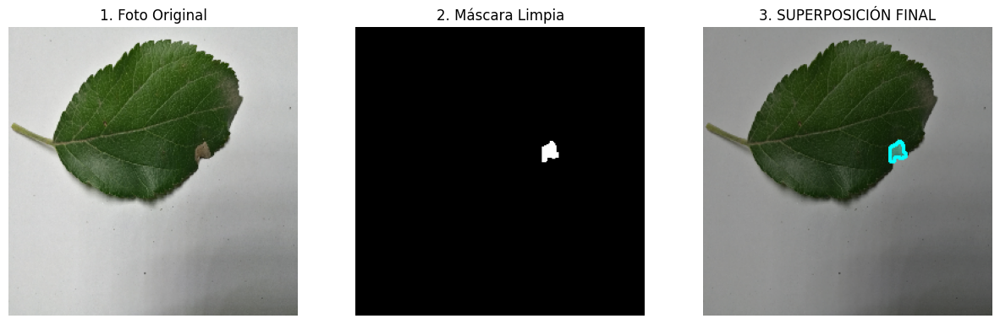

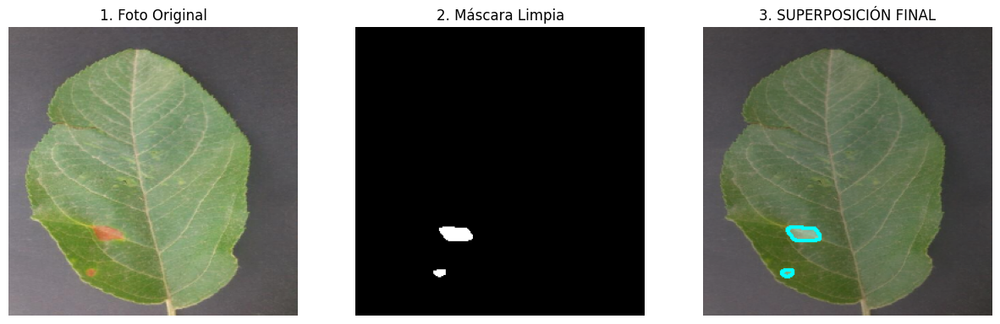

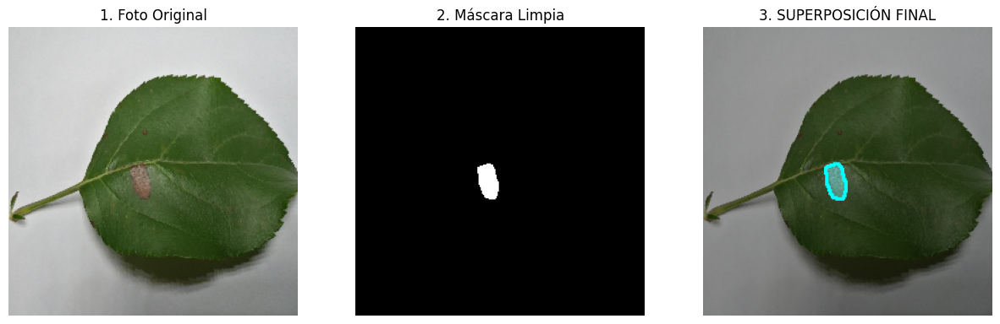

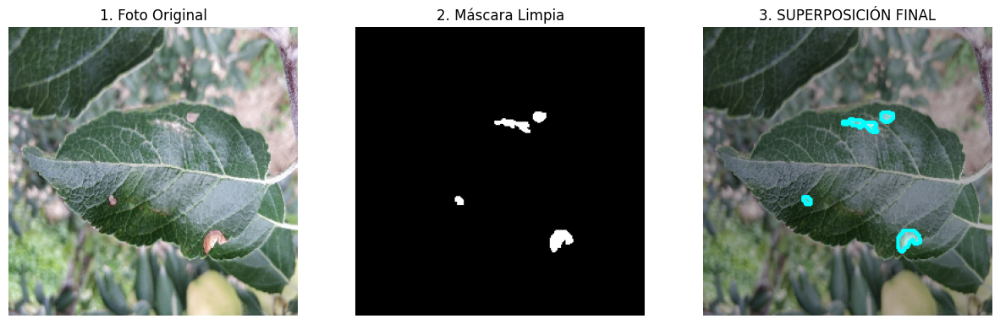

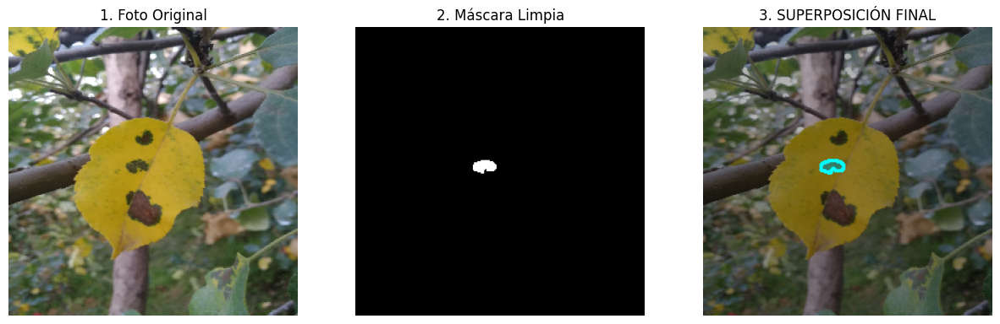

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import random
from google.colab import drive

# 1. RECUPERAMOS LA CLASE DE LIMPIEZA (La que acabamos de hacer)
class RGBMaskCleaner:
    def clean_mask(self, mask_rgb_path):
        mask_bgr = cv2.imread(mask_rgb_path)
        if mask_bgr is None: return None
        hsv = cv2.cvtColor(mask_bgr, cv2.COLOR_BGR2HSV)

        # Filtros (Negro y Rojo)
        lower_black = np.array([0, 0, 0]); upper_black = np.array([180, 255, 60])
        mask_black = cv2.inRange(hsv, lower_black, upper_black)

        lower_red1 = np.array([0, 50, 50]); upper_red1 = np.array([10, 255, 255])
        lower_red2 = np.array([170, 50, 50]); upper_red2 = np.array([180, 255, 255])
        mask_red = cv2.bitwise_or(cv2.inRange(hsv, lower_red1, upper_red1), cv2.inRange(hsv, lower_red2, upper_red2))

        to_remove = cv2.bitwise_or(mask_black, mask_red)
        disease_mask = cv2.bitwise_not(to_remove)

        kernel = np.ones((3,3), np.uint8)
        disease_mask = cv2.morphologyEx(disease_mask, cv2.MORPH_OPEN, kernel, iterations=1)
        return disease_mask

# 2. NUEVA CLASE PARA SUPERPONER (Overlay)
class OverlayVisualizer:
    def show_overlay(self, img_path, binary_mask, title="Superposición"):
        # Leer imagen original
        img = cv2.imread(img_path)
        if img is None: return
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Asegurar tamaños
        if binary_mask.shape != img.shape[:2]:
            binary_mask = cv2.resize(binary_mask, (img.shape[1], img.shape[0]))

        # --- CREAR EFECTO DE SUPERPOSICIÓN ---
        # 1. Crear una imagen de color sólido (ej: Azul Cian Neon)
        color_layer = np.zeros_like(img)
        # Pintamos de Azul Cian [0, 255, 255] (en RGB) donde la máscara es blanca
        color_layer[binary_mask > 0] = [0, 255, 255]

        # 2. Mezclar con la original (Transparencia)
        # alpha=0.7 (img original), beta=0.3 (color capa)
        overlay_img = cv2.addWeighted(img, 0.7, color_layer, 0.3, 0)

        # 3. Dibujar contornos sólidos para resaltar bordes
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cv2.drawContours(overlay_img, contours, -1, (0, 255, 255), 2)

        # --- MOSTRAR ---
        plt.figure(figsize=(15, 6))

        # Izquierda: Original
        plt.subplot(1, 3, 1)
        plt.imshow(img)
        plt.title("1. Foto Original")
        plt.axis('off')

        # Centro: Máscara Binaria (La limpia)
        plt.subplot(1, 3, 2)
        plt.imshow(binary_mask, cmap='gray')
        plt.title("2. Máscara Limpia")
        plt.axis('off')

        # Derecha: Resultado Final
        plt.subplot(1, 3, 3)
        plt.imshow(overlay_img)
        plt.title("3. SUPERPOSICIÓN FINAL")
        plt.axis('off')

        plt.show()

# ---------------------------------------------------------
# SCRIPT DE EJECUCIÓN
# ---------------------------------------------------------
cleaner = RGBMaskCleaner()
viz = OverlayVisualizer()

if not os.path.exists('/content/drive'):
    drive.mount('/content/drive')

search_path = "/content/drive/MyDrive"
candidates = glob.glob(f'{search_path}/**/AppleTreeLeafDisease', recursive=True)

if candidates:
    dataset_root = candidates[0]

    # Buscamos imágenes
    all_images = glob.glob(f"{dataset_root}/**/image/*.jpg", recursive=True) + \
                 glob.glob(f"{dataset_root}/**/image/*.png", recursive=True)

    if all_images:
        print("✨ GENERANDO SUPERPOSICIÓN (Highlight) EN IMÁGENES...")
        samples = random.sample(all_images, min(len(all_images), 5))

        for img_path in samples:
            label_dir = os.path.dirname(img_path).replace('/image', '/label')
            base_name = os.path.splitext(os.path.basename(img_path))[0]
            mask_candidates = glob.glob(f"{label_dir}/{base_name}.*")

            if mask_candidates:
                # 1. Limpiamos la máscara (obtenemos blanco/negro)
                clean_mask = cleaner.clean_mask(mask_candidates[0])

                # 2. La ponemos sobre la imagen original
                if clean_mask is not None:
                    viz.show_overlay(img_path, clean_mask, title=base_name)
            else:
                pass

🔳 GENERANDO CAJAS CUADRADAS...
   🟥 Cajas Cuadradas generadas: 0


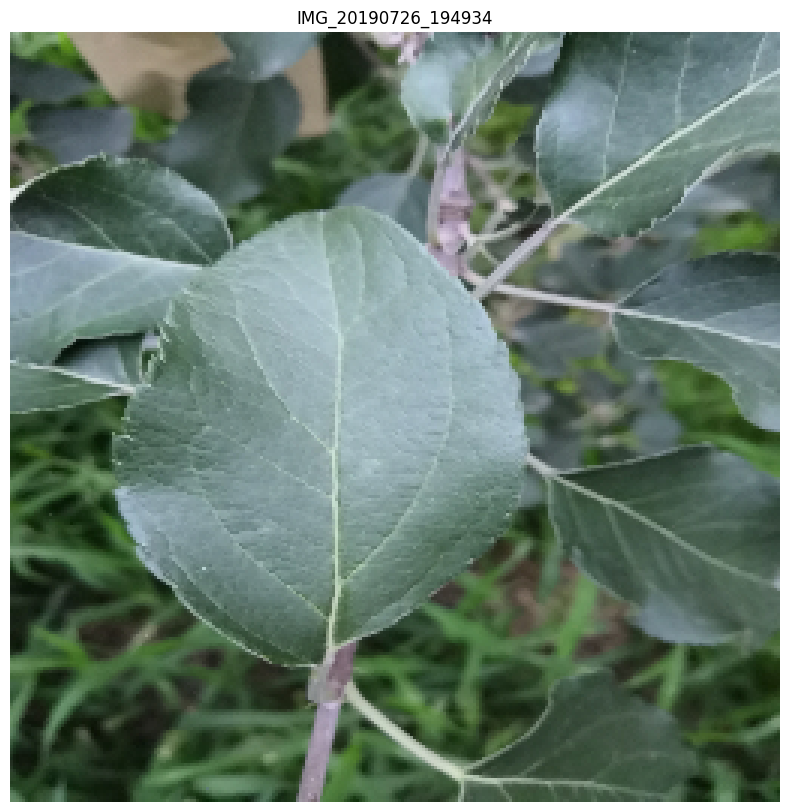

   🟥 Cajas Cuadradas generadas: 1


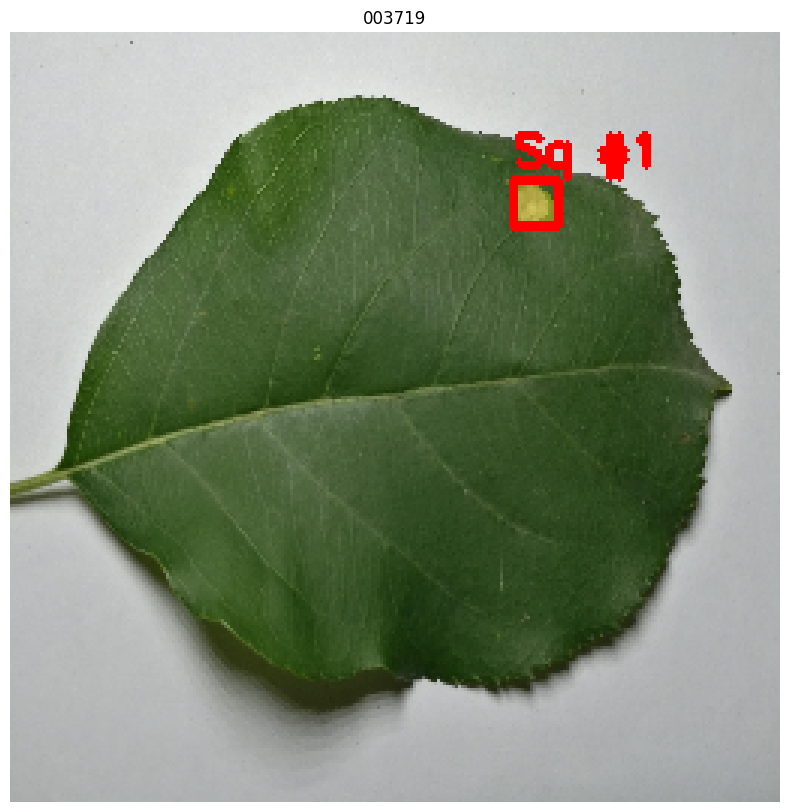

   🟥 Cajas Cuadradas generadas: 1


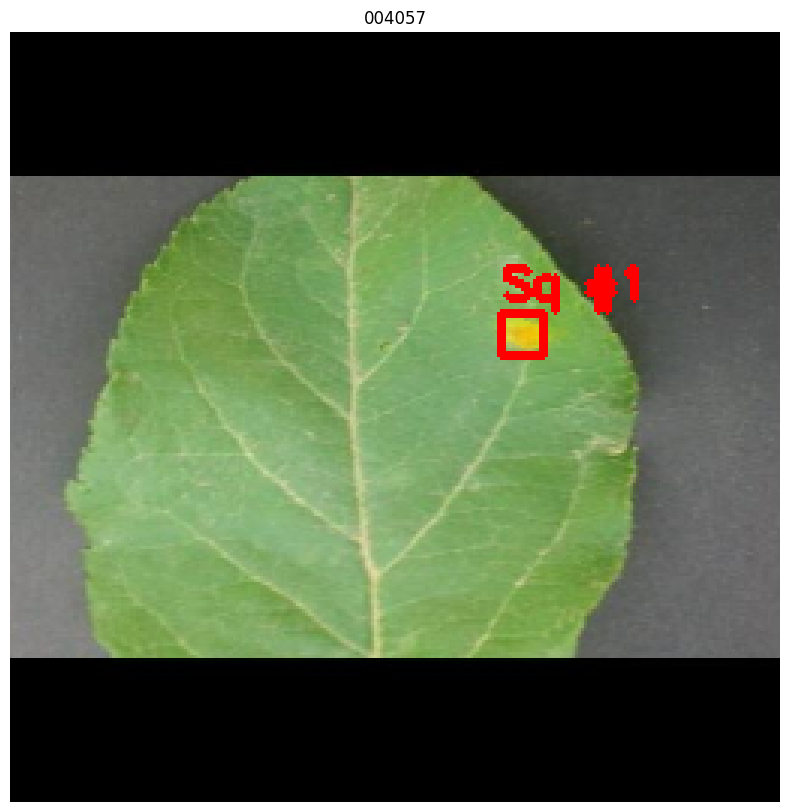

   🟥 Cajas Cuadradas generadas: 1


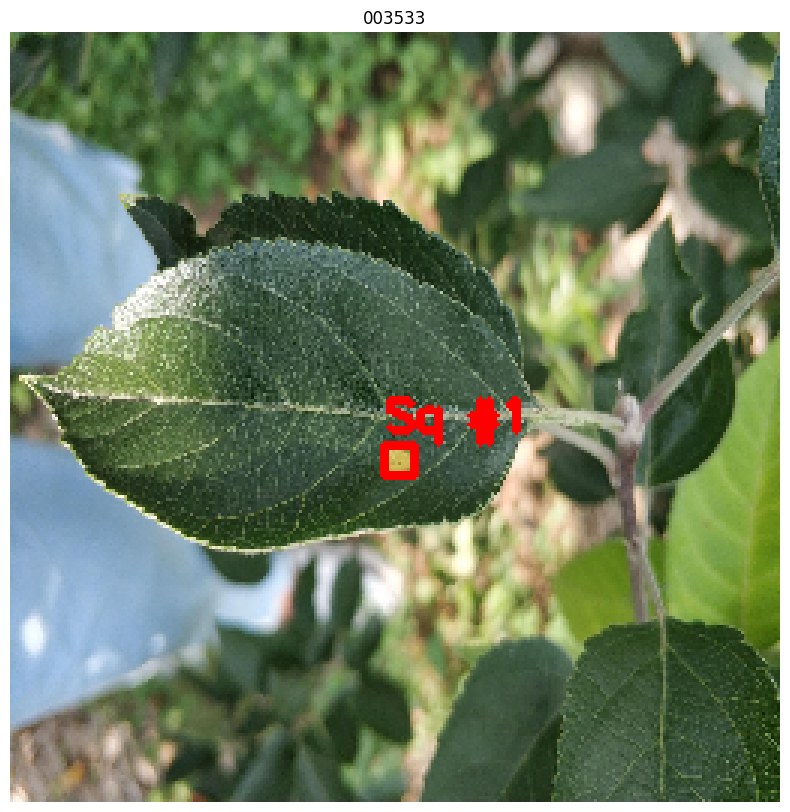

   🟥 Cajas Cuadradas generadas: 3


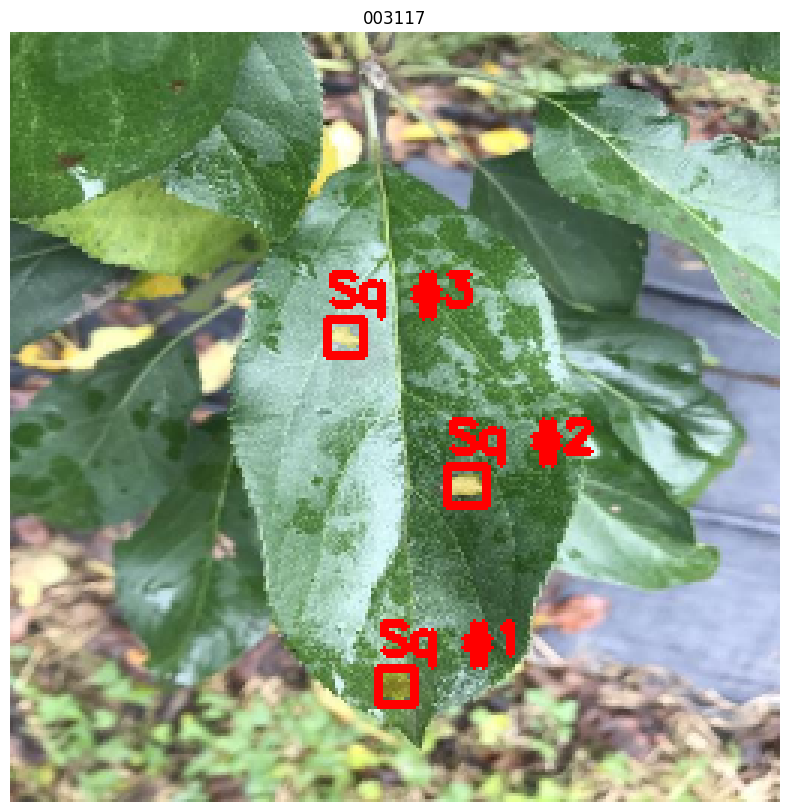

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import random
from google.colab import drive

# ---------------------------------------------------------
# 1. LIMPIADOR DE MÁSCARA (La base que ya funcionaba)
# ---------------------------------------------------------
class RGBMaskCleaner:
    def clean_mask(self, mask_rgb_path):
        mask_bgr = cv2.imread(mask_rgb_path)
        if mask_bgr is None: return None
        hsv = cv2.cvtColor(mask_bgr, cv2.COLOR_BGR2HSV)

        # Filtros para quitar Negro y Rojo
        lower_black = np.array([0, 0, 0]); upper_black = np.array([180, 255, 60])
        mask_black = cv2.inRange(hsv, lower_black, upper_black)

        lower_red1 = np.array([0, 50, 50]); upper_red1 = np.array([10, 255, 255])
        lower_red2 = np.array([170, 50, 50]); upper_red2 = np.array([180, 255, 255])
        mask_red = cv2.bitwise_or(cv2.inRange(hsv, lower_red1, upper_red1), cv2.inRange(hsv, lower_red2, upper_red2))

        to_remove = cv2.bitwise_or(mask_black, mask_red)
        disease_mask = cv2.bitwise_not(to_remove)

        kernel = np.ones((3,3), np.uint8)
        disease_mask = cv2.morphologyEx(disease_mask, cv2.MORPH_OPEN, kernel, iterations=1)
        return disease_mask

# ---------------------------------------------------------
# 2. DETECTOR DE CUADRADOS (La lógica nueva)
# ---------------------------------------------------------
class SquareDetector:
    def get_square_bboxes(self, binary_mask):
        # Encontrar contornos en la máscara limpia
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        square_bboxes = []
        img_h, img_w = binary_mask.shape[:2]

        for cnt in contours:
            area = cv2.contourArea(cnt)
            if area > 10: # Filtro de ruido
                # 1. Obtener rectángulo original (x, y, w, h)
                x, y, w, h = cv2.boundingRect(cnt)

                # 2. Calcular el centro de esa mancha
                center_x = x + w // 2
                center_y = y + h // 2

                # 3. Determinar el lado del cuadrado (el mayor de los dos lados)
                side = max(w, h)

                # 4. Recalcular la esquina superior izquierda (x, y)
                # para que el cuadrado siga centrado
                new_x = center_x - side // 2
                new_y = center_y - side // 2

                # 5. CORRECCIÓN DE BORDES (Evitar salirse de la foto)
                # Si se sale por la izquierda, lo ponemos en 0
                if new_x < 0: new_x = 0
                if new_y < 0: new_y = 0
                # Si se sale por la derecha/abajo, recortamos el tamaño
                if (new_x + side) > img_w: side = img_w - new_x
                if (new_y + side) > img_h: side = img_h - new_y

                # Guardamos la caja cuadrada (x, y, lado, lado)
                square_bboxes.append((new_x, new_y, side, side))

        return square_bboxes

# ---------------------------------------------------------
# 3. VISUALIZADOR
# ---------------------------------------------------------
class Visualizer:
    def show(self, img_path, mask, bboxes, title):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Superposición amarilla
        overlay = img.copy()
        overlay[mask > 0] = [255, 255, 0]
        img = cv2.addWeighted(img, 0.7, overlay, 0.3, 0)

        print(f"   🟥 Cajas Cuadradas generadas: {len(bboxes)}")

        for i, bbox in enumerate(bboxes):
            x, y, w, h = bbox
            # Dibujar rectángulo (que ahora será cuadrado visualmente)
            cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 2)
            # Etiqueta
            cv2.putText(img, f"Sq #{i+1}", (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 2)

        plt.figure(figsize=(10, 10))
        plt.imshow(img)
        plt.title(title)
        plt.axis('off')
        plt.show()

# ---------------------------------------------------------
# EJECUCIÓN
# ---------------------------------------------------------
cleaner = RGBMaskCleaner()
sq_detector = SquareDetector()
viz = Visualizer()

if not os.path.exists('/content/drive'):
    drive.mount('/content/drive')

search_path = "/content/drive/MyDrive"
candidates = glob.glob(f'{search_path}/**/AppleTreeLeafDisease', recursive=True)

if candidates:
    dataset_root = candidates[0]
    all_images = glob.glob(f"{dataset_root}/**/image/*.jpg", recursive=True) + \
                 glob.glob(f"{dataset_root}/**/image/*.png", recursive=True)

    if all_images:
        print("🔳 GENERANDO CAJAS CUADRADAS...")
        samples = random.sample(all_images, min(len(all_images), 5))

        for img_path in samples:
            label_dir = os.path.dirname(img_path).replace('/image', '/label')
            base_name = os.path.splitext(os.path.basename(img_path))[0]
            mask_candidates = glob.glob(f"{label_dir}/{base_name}.*")

            if mask_candidates:
                # 1. Limpiar máscara
                clean_mask = cleaner.clean_mask(mask_candidates[0])

                if clean_mask is not None:
                    # 2. Calcular Cajas CUADRADAS
                    sq_bboxes = sq_detector.get_square_bboxes(clean_mask)

                    # 3. Mostrar
                    viz.show(img_path, clean_mask, sq_bboxes, title=base_name)
            else:
                pass

In [10]:
import cv2
import numpy as np
import os
import glob
import shutil
import yaml
import random
from sklearn.model_selection import train_test_split
from google.colab import drive

# ==========================================
# 1. HERRAMIENTAS DE PROCESAMIENTO (Las que ya validamos)
# ==========================================
class RGBMaskCleaner:
    def clean_mask(self, mask_bgr):
        if mask_bgr is None: return None
        hsv = cv2.cvtColor(mask_bgr, cv2.COLOR_BGR2HSV)

        # Filtros (Negro y Rojo)
        lower_black = np.array([0, 0, 0]); upper_black = np.array([180, 255, 60])
        mask_black = cv2.inRange(hsv, lower_black, upper_black)

        lower_red1 = np.array([0, 50, 50]); upper_red1 = np.array([10, 255, 255])
        lower_red2 = np.array([170, 50, 50]); upper_red2 = np.array([180, 255, 255])
        mask_red = cv2.bitwise_or(cv2.inRange(hsv, lower_red1, upper_red1), cv2.inRange(hsv, lower_red2, upper_red2))

        to_remove = cv2.bitwise_or(mask_black, mask_red)
        disease_mask = cv2.bitwise_not(to_remove)

        kernel = np.ones((3,3), np.uint8)
        disease_mask = cv2.morphologyEx(disease_mask, cv2.MORPH_OPEN, kernel, iterations=1)
        return disease_mask

class SquareYOLOConverter:
    def get_square_bboxes_yolo(self, binary_mask, img_w, img_h):
        """Devuelve cajas normalizadas (class_id, x_center, y_center, w, h)"""
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        yolo_lines = []

        for cnt in contours:
            if cv2.contourArea(cnt) > 20: # Filtro ruido
                # 1. Bounding Box original
                x, y, w, h = cv2.boundingRect(cnt)

                # 2. Hacerlo Cuadrado
                center_x = x + w // 2
                center_y = y + h // 2
                side = max(w, h)

                # 3. Normalizar para YOLO (Dividir por ancho/alto de imagen)
                # YOLO formato: x_center_norm y_center_norm w_norm h_norm

                # Coordenadas normalizadas del centro
                nx = center_x / img_w
                ny = center_y / img_h
                nw = side / img_w
                nh = side / img_h

                # Limitar a 1.0 para no salir de la imagen
                nx = min(max(nx, 0), 1)
                ny = min(max(ny, 0), 1)
                nw = min(max(nw, 0), 1)
                nh = min(max(nh, 0), 1)

                yolo_lines.append((nx, ny, nw, nh))

        return yolo_lines

# ==========================================
# 2. SCRIPT DE CONVERSIÓN MASIVA
# ==========================================

print("🤖 VcBot: Iniciando conversión a formato YOLO...")

if not os.path.exists('/content/drive'):
    drive.mount('/content/drive')

# --- CONFIGURACIÓN ---
OUTPUT_DIR = "/content/yolo_dataset_final"  # Donde se guardará el nuevo dataset
SOURCE_ROOT = "/content/drive/MyDrive"      # Donde buscamos el original

# Limpiar carpeta de salida si existía
if os.path.exists(OUTPUT_DIR):
    shutil.rmtree(OUTPUT_DIR)

# Crear estructura YOLO
for split in ['train', 'val']:
    os.makedirs(f"{OUTPUT_DIR}/{split}/images", exist_ok=True)
    os.makedirs(f"{OUTPUT_DIR}/{split}/labels", exist_ok=True)

# Instancias
cleaner = RGBMaskCleaner()
converter = SquareYOLOConverter()

# 1. BUSCAR TODAS LAS IMÁGENES Y SUS CLASES
print("🔍 Escaneando Google Drive...")
images_found = [] # Lista de tuplas (ruta_img, nombre_clase)
classes = set()

# Buscamos la carpeta raíz
candidates = glob.glob(f'{SOURCE_ROOT}/**/AppleTreeLeafDisease', recursive=True)
if not candidates:
    raise Exception("No se encontró el dataset en Drive")

dataset_root = candidates[0]

# Recorremos para encontrar clases (carpetas padre de 'image')
for root, dirs, files in os.walk(dataset_root):
    if 'image' in dirs:
        class_name = os.path.basename(root) # Ej: Rust, Scab
        classes.add(class_name)

        img_dir = os.path.join(root, 'image')
        # Buscar fotos
        imgs = glob.glob(f"{img_dir}/*.jpg") + glob.glob(f"{img_dir}/*.png")
        for img in imgs:
            images_found.append((img, class_name))

# Crear mapa de IDs (Rust -> 0, Scab -> 1...)
class_to_id = {name: i for i, name in enumerate(sorted(list(classes)))}
print(f"📋 Clases detectadas: {class_to_id}")

# 2. DIVIDIR TRAIN / VAL (80% / 20%)
train_imgs, val_imgs = train_test_split(images_found, test_size=0.2, random_state=42)

def process_batch(image_list, split_name):
    print(f"⚙️ Procesando {len(image_list)} imágenes para '{split_name}'...")

    count = 0
    for img_path, class_name in image_list:
        # A. Leer Imagen
        img = cv2.imread(img_path)
        if img is None: continue
        h, w = img.shape[:2]

        # B. Encontrar Máscara
        label_dir = os.path.dirname(img_path).replace('/image', '/label')
        base_name = os.path.splitext(os.path.basename(img_path))[0]
        mask_candidates = glob.glob(f"{label_dir}/{base_name}.*")

        yolo_content = []

        if mask_candidates:
            # C. Limpiar Máscara
            mask_rgb = cv2.imread(mask_candidates[0])
            clean_mask = cleaner.clean_mask(mask_rgb)

            if clean_mask is not None:
                # D. Obtener Cajas Cuadradas Normalizadas
                bboxes = converter.get_square_bboxes_yolo(clean_mask, w, h)

                class_id = class_to_id[class_name]

                # E. Formatear línea YOLO: "id x y w h"
                for (nx, ny, nw, nh) in bboxes:
                    yolo_content.append(f"{class_id} {nx:.6f} {ny:.6f} {nw:.6f} {nh:.6f}")

        # F. GUARDAR SI TIENE ETIQUETAS (O si quieres incluir backgrounds vacíos, quita el if)
        if yolo_content:
            # Copiar imagen
            dest_img = f"{OUTPUT_DIR}/{split_name}/images/{base_name}.jpg"
            cv2.imwrite(dest_img, img) # Re-guardamos para asegurar formato

            # Guardar TXT
            dest_txt = f"{OUTPUT_DIR}/{split_name}/labels/{base_name}.txt"
            with open(dest_txt, 'w') as f:
                f.write('\n'.join(yolo_content))

            count += 1

    print(f"   ✅ {count} imágenes convertidas correctamente en {split_name}.")

# 3. EJECUTAR PROCESAMIENTO
process_batch(train_imgs, 'train')
process_batch(val_imgs, 'val')

# 4. CREAR ARCHIVO DATA.YAML
yaml_content = f"""
path: {OUTPUT_DIR}
train: train/images
val: val/images

nc: {len(classes)}
names: {list(class_to_id.keys())}
"""

with open(f"{OUTPUT_DIR}/data.yaml", 'w') as f:
    f.write(yaml_content)

print("\n🎉 ¡DATASET YOLO COMPLETADO!")
print(f"📁 Ubicación: {OUTPUT_DIR}")
print("📄 Archivo de configuración: data.yaml creado.")

🤖 VcBot: Iniciando conversión a formato YOLO...
🔍 Escaneando Google Drive...
📋 Clases detectadas: {'Alternaria_Leaf_Spot': 0, 'Brown_Spot': 1, 'Gray_Spot': 2, 'Healthy_Leaf': 3, 'Rust': 4}
⚙️ Procesando 962 imágenes para 'train'...
   ✅ 594 imágenes convertidas correctamente en train.
⚙️ Procesando 241 imágenes para 'val'...
   ✅ 155 imágenes convertidas correctamente en val.

🎉 ¡DATASET YOLO COMPLETADO!
📁 Ubicación: /content/yolo_dataset_final
📄 Archivo de configuración: data.yaml creado.


🤖 VcBot: Iniciando verificación del dataset YOLO...
📋 Clases encontradas en YAML: ['Alternaria_Leaf_Spot', 'Brown_Spot', 'Gray_Spot', 'Healthy_Leaf', 'Rust']

📂 Revisando carpeta 'train' (594 imágenes)...


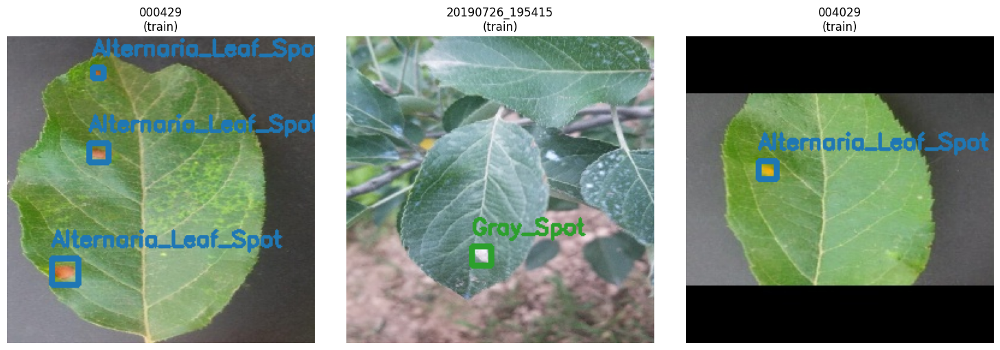


📂 Revisando carpeta 'val' (155 imágenes)...


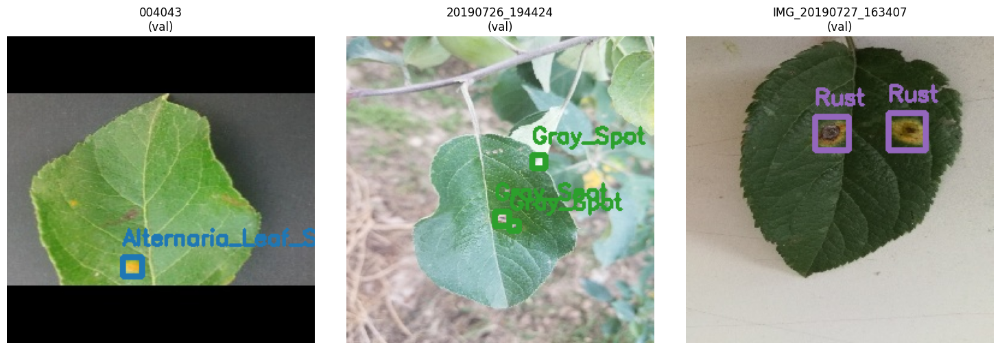


📊 RECUENTO FINAL DE ARCHIVOS GENERADOS:
   - TRAIN: 594 imágenes | 594 etiquetas (.txt)
   - VAL: 155 imágenes | 155 etiquetas (.txt)
----------------------------------------
✅ TODO CORRECTO: Tienes el mismo número de fotos y etiquetas.
🚀 ¡TU DATASET ESTÁ LISTO PARA ENTRENAR!


In [11]:
import cv2
import matplotlib.pyplot as plt
import os
import glob
import yaml
import random

print("🤖 VcBot: Iniciando verificación del dataset YOLO...")

# RUTA DEL DATASET (La misma que usamos en el paso anterior)
DATASET_PATH = "/content/yolo_dataset_final"

# 1. LEER EL ARCHIVO DATA.YAML PARA SABER LOS NOMBRES DE LAS CLASES
yaml_path = os.path.join(DATASET_PATH, "data.yaml")
class_names = []

if os.path.exists(yaml_path):
    with open(yaml_path, 'r') as f:
        data = yaml.safe_load(f)
        class_names = data.get('names', [])
    print(f"📋 Clases encontradas en YAML: {class_names}")
else:
    print("⚠️ No encontré data.yaml, usaré IDs numéricos.")

# 2. FUNCIÓN PARA DIBUJAR CAJAS YOLO
def visualize_yolo_data(image_path, label_path, class_names):
    # Leer imagen
    img = cv2.imread(image_path)
    if img is None: return None
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h_img, w_img, _ = img.shape

    # Leer etiquetas
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            lines = f.readlines()

        for line in lines:
            parts = line.strip().split()
            # Formato YOLO: class_id x_center y_center width height
            cls_id = int(parts[0])
            nx, ny, nw, nh = map(float, parts[1:])

            # --- DES-NORMALIZAR (Matemática inversa) ---
            # Convertir de 0..1 a Píxeles
            w_box = int(nw * w_img)
            h_box = int(nh * h_img)
            x_center = int(nx * w_img)
            y_center = int(ny * h_img)

            # Calcular esquina superior izquierda para dibujar
            x1 = int(x_center - w_box / 2)
            y1 = int(y_center - h_box / 2)
            x2 = x1 + w_box
            y2 = y1 + h_box

            # --- DIBUJAR ---
            # Color dinámico según clase
            color = plt.cm.tab10(cls_id % 10)
            color = (int(color[0]*255), int(color[1]*255), int(color[2]*255))

            cv2.rectangle(img, (x1, y1), (x2, y2), color, 3)

            # Nombre de la clase
            label = class_names[cls_id] if cls_id < len(class_names) else str(cls_id)
            cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

    return img

# 3. MOSTRAR EJEMPLOS DE TRAIN Y VAL
dirs_to_check = ['train', 'val']

for split in dirs_to_check:
    img_dir = os.path.join(DATASET_PATH, split, 'images')
    label_dir = os.path.join(DATASET_PATH, split, 'labels')

    # Buscar imágenes
    images = glob.glob(f"{img_dir}/*.jpg") + glob.glob(f"{img_dir}/*.png")

    print(f"\n📂 Revisando carpeta '{split}' ({len(images)} imágenes)...")

    if len(images) > 0:
        # Tomar 3 muestras aleatorias
        samples = random.sample(images, min(len(images), 3))

        plt.figure(figsize=(15, 5))
        for i, img_path in enumerate(samples):
            # Construir ruta del label correspondiente
            base_name = os.path.splitext(os.path.basename(img_path))[0]
            txt_path = os.path.join(label_dir, base_name + ".txt")

            # Visualizar
            res_img = visualize_yolo_data(img_path, txt_path, class_names)

            if res_img is not None:
                plt.subplot(1, 3, i+1)
                plt.imshow(res_img)
                plt.axis('off')
                plt.title(f"{base_name}\n({split})")

        plt.tight_layout()
        plt.show()
    else:
        print(f"⚠️ La carpeta {split} está vacía.")

# 4. RESUMEN FINAL DE ARCHIVOS
print("\n📊 RECUENTO FINAL DE ARCHIVOS GENERADOS:")
total_imgs = 0
total_lbls = 0
for split in ['train', 'val']:
    n_img = len(os.listdir(os.path.join(DATASET_PATH, split, 'images')))
    n_lbl = len(os.listdir(os.path.join(DATASET_PATH, split, 'labels')))
    print(f"   - {split.upper()}: {n_img} imágenes | {n_lbl} etiquetas (.txt)")
    total_imgs += n_img
    total_lbls += n_lbl

print("-" * 40)
if total_imgs == total_lbls and total_imgs > 0:
    print("✅ TODO CORRECTO: Tienes el mismo número de fotos y etiquetas.")
    print("🚀 ¡TU DATASET ESTÁ LISTO PARA ENTRENAR!")
else:
    print("⚠️ ADVERTENCIA: Los números no coinciden o están vacíos.")

## prueba con 30% datos pata elegir el yolo que se ajusta


In [12]:
import os
import shutil
import glob
import random
import yaml
from sklearn.model_selection import train_test_split

print("🤖 VcBot: Creando versión reducida del dataset para pruebas rápidas...")

# CONFIGURACIÓN
ORIGINAL_PATH = "/content/yolo_dataset_final"
MINI_PATH = "/content/yolo_mini"
FRACTION = 0.3  # Usaremos solo el 30% de los datos (Ajusta si quieres más/menos)

# 1. Limpiar/Crear carpetas
if os.path.exists(MINI_PATH): shutil.rmtree(MINI_PATH)

for split in ['train', 'val']:
    os.makedirs(f"{MINI_PATH}/{split}/images", exist_ok=True)
    os.makedirs(f"{MINI_PATH}/{split}/labels", exist_ok=True)

# 2. Función de Muestreo y Copia
def create_subset(split_name):
    img_dir = os.path.join(ORIGINAL_PATH, split_name, 'images')
    lbl_dir = os.path.join(ORIGINAL_PATH, split_name, 'labels')

    # Listar imágenes
    images = glob.glob(f"{img_dir}/*.jpg") + glob.glob(f"{img_dir}/*.png")

    # Tomar muestra aleatoria
    if len(images) > 0:
        sample_size = int(len(images) * FRACTION)
        # Aseguramos mínimo 10 fotos para que no falle
        sample_size = max(sample_size, 10)
        subset = random.sample(images, min(len(images), sample_size))

        print(f"   ✂️ {split_name}: Copiando {len(subset)} de {len(images)} imágenes...")

        for img_path in subset:
            # Copiar Imagen
            shutil.copy(img_path, f"{MINI_PATH}/{split_name}/images/")

            # Copiar Label correspondiente
            base_name = os.path.splitext(os.path.basename(img_path))[0]
            txt_path = os.path.join(lbl_dir, base_name + ".txt")
            if os.path.exists(txt_path):
                shutil.copy(txt_path, f"{MINI_PATH}/{split_name}/labels/")
    else:
        print(f"   ⚠️ No hay imágenes en {split_name}")

create_subset('train')
create_subset('val')

# 3. Crear data.yaml para el Mini
# Leemos los nombres del original para no perderlos
with open(f"{ORIGINAL_PATH}/data.yaml", 'r') as f:
    old_yaml = yaml.safe_load(f)

new_yaml = {
    'path': MINI_PATH,
    'train': 'train/images',
    'val': 'val/images',
    'nc': old_yaml['nc'],
    'names': old_yaml['names']
}

with open(f"{MINI_PATH}/data.yaml", 'w') as f:
    yaml.dump(new_yaml, f)

print(f"✅ Mini-Dataset listo en: {MINI_PATH}")

🤖 VcBot: Creando versión reducida del dataset para pruebas rápidas...
   ✂️ train: Copiando 178 de 594 imágenes...
   ✂️ val: Copiando 46 de 155 imágenes...
✅ Mini-Dataset listo en: /content/yolo_mini


🤖 VcBot: Iniciando EL TORNEO DE MODELOS...

🔥 ENTRENANDO: yolov8n.pt ...
Ultralytics 8.3.245 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_mini/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8n2, nbs=64, nms=False, opset=None, optimize=False, optimizer=au

/tmp/ipython-input-1756824614.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x='Modelo', y='mAP50-95 (Alta Precisión)', palette='viridis')
/tmp/ipython-input-1756824614.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x='Modelo', y='Velocidad (ms)', palette='rocket')


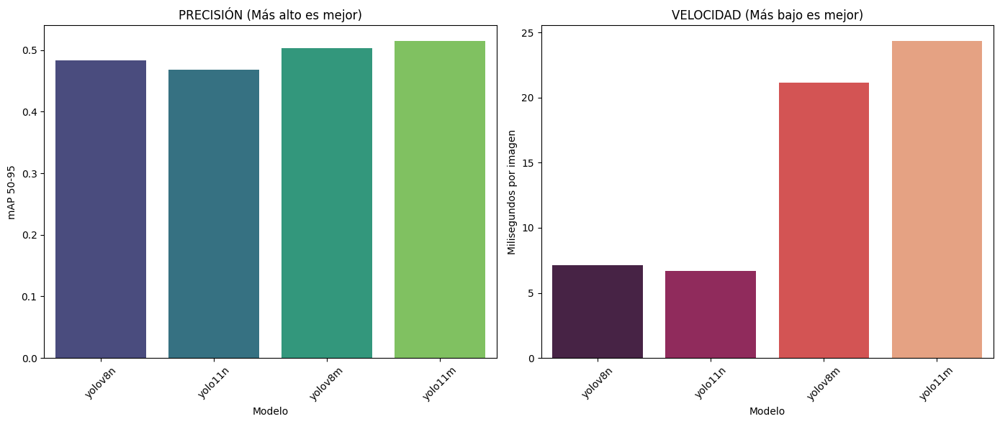

In [13]:
from ultralytics import YOLO
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch

print("🤖 VcBot: Iniciando EL TORNEO DE MODELOS...")

# LISTA DE COMPETIDORES
models_to_test = [
    'yolov8n.pt',  # V8 Nano
    'yolo11n.pt',  # V11 Nano
    'yolov8m.pt',  # V8 Medium
    'yolo11m.pt'   # V11 Medium
]

results_data = []

for model_name in models_to_test:
    print(f"\n🔥 ENTRENANDO: {model_name} ...")

    # 1. Cargar modelo
    model = YOLO(model_name)

    # 2. Entrenar (Rápido: 20 épocas, Mini Dataset)
    # Usamos imgsz=640 para que el test sea veloz,
    # pero para el final usaremos 1024.
    train_res = model.train(
        data='/content/yolo_mini/data.yaml',
        epochs=20,
        imgsz=640,
        batch=8,
        device=0 if torch.cuda.is_available() else 'cpu',
        project='benchmark_results',
        name=model_name.replace('.pt', ''),
        verbose=False # Para no llenar la pantalla de texto
    )

    # 3. Guardar métricas clave
    metrics = model.val(split='val')

    map50 = metrics.box.map50       # Precisión general
    map50_95 = metrics.box.map     # Precisión fina (importante para ti)
    speed = metrics.speed['inference'] # Velocidad (ms por imagen)

    results_data.append({
        'Modelo': model_name.replace('.pt', ''),
        'mAP50': map50,
        'mAP50-95 (Alta Precisión)': map50_95,
        'Velocidad (ms)': speed
    })

print("\n🏁 ¡TORNEO FINALIZADO!")

# --- VISUALIZACIÓN DE RESULTADOS ---
df = pd.DataFrame(results_data)

# Mostrar Tabla
print("\n📋 TABLA DE RESULTADOS:")
print(df)

# Gráficos Comparativos
plt.figure(figsize=(14, 6))

# Gráfico 1: Precisión (mAP50-95)
plt.subplot(1, 2, 1)
sns.barplot(data=df, x='Modelo', y='mAP50-95 (Alta Precisión)', palette='viridis')
plt.title("PRECISIÓN (Más alto es mejor)")
plt.ylabel("mAP 50-95")
plt.xticks(rotation=45)

# Gráfico 2: Velocidad (Inferencia)
plt.subplot(1, 2, 2)
sns.barplot(data=df, x='Modelo', y='Velocidad (ms)', palette='rocket')
plt.title("VELOCIDAD (Más bajo es mejor)")
plt.ylabel("Milisegundos por imagen")
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

## prueba con dataset completo

🤖 VcBot: Iniciando EL TORNEO FINAL (DATASET COMPLETO)...

🔥 ENTRENANDO CON DATASET COMPLETO: yolov8n.pt ...
Ultralytics 8.3.245 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_dataset_final/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8n, nbs=64, nms=Fal

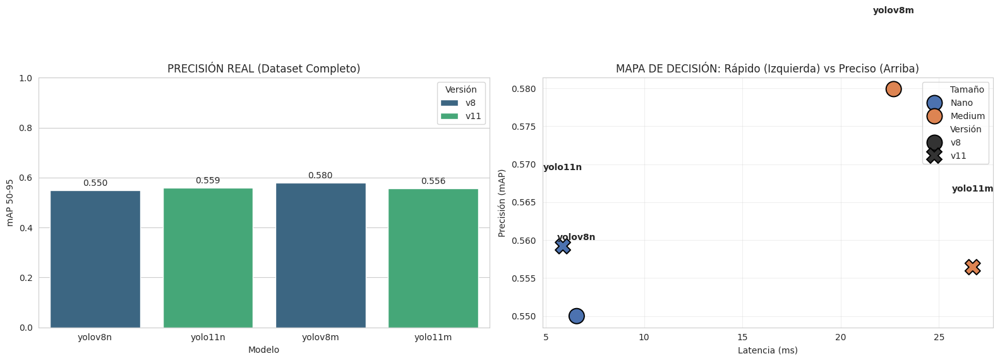

In [22]:
from ultralytics import YOLO
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import gc # Garbage Collector para limpiar memoria
import os

print("🤖 VcBot: Iniciando EL TORNEO FINAL (DATASET COMPLETO)...")

# 1. RUTA AL DATASET COMPLETO
# Asegúrate de que esta carpeta existe (la creamos en el paso de conversión a YOLO)
FULL_DATASET_YAML = '/content/yolo_dataset_final/data.yaml'

if not os.path.exists(FULL_DATASET_YAML):
    raise FileNotFoundError(f"❌ No encuentro el dataset en: {FULL_DATASET_YAML}")

# LISTA DE COMPETIDORES
models_to_test = [
    'yolov8n.pt',  # V8 Nano
    'yolo11n.pt',  # V11 Nano
    'yolov8m.pt',  # V8 Medium
    'yolo11m.pt'   # V11 Medium
]

results_data = []
device = 0 if torch.cuda.is_available() else 'cpu'

for model_name in models_to_test:
    print(f"\n🔥 ENTRENANDO CON DATASET COMPLETO: {model_name} ...")

    # --- LIMPIEZA DE MEMORIA (CRÍTICO) ---
    # Esto evita que Colab explote por falta de RAM entre entrenamientos
    gc.collect()
    torch.cuda.empty_cache()
    # -------------------------------------

    # 1. Cargar modelo
    model = YOLO(model_name)

    # 2. Entrenar
    # Mantenemos 20 épocas. Si tarda demasiado, puedes bajarlo a 10.
    train_res = model.train(
        data=FULL_DATASET_YAML,
        epochs=20,               # 20 épocas es un buen benchmark sólido
        imgsz=640,
        batch=16,                # Subimos un poco el batch si la GPU lo permite (sino baja a 8)
        device=device,
        project='benchmark_full_dataset',
        name=model_name.replace('.pt', ''),
        verbose=False,
        plots=False
    )

    # 3. Validar
    metrics = model.val(split='val', verbose=False)

    map50 = metrics.box.map50
    map50_95 = metrics.box.map
    # Sumamos tiempos para tener la latencia real total
    speed = metrics.speed['inference'] + metrics.speed['preprocess'] + metrics.speed['loss']

    results_data.append({
        'Modelo': model_name.replace('.pt', ''),
        'mAP50': map50,
        'mAP50-95 (Alta Precisión)': map50_95,
        'Velocidad (ms)': speed,
        'Versión': 'v11' if '11' in model_name else 'v8',
        'Tamaño': 'Medium' if 'm.pt' in model_name else 'Nano'
    })

    print(f"   ✅ {model_name} Terminado: mAP={map50_95:.4f}")

print("\n🏁 ¡TORNEO FINALIZADO!")

# --- VISUALIZACIÓN DE RESULTADOS ---
if len(results_data) > 0:
    df = pd.DataFrame(results_data)

    # Mostrar Tabla Ordenada
    print("\n📋 TABLA DE RESULTADOS (Ordenada por Precisión):")
    print(df.sort_values(by='mAP50-95 (Alta Precisión)', ascending=False))

    # Gráficos Comparativos
    plt.figure(figsize=(16, 6))

    # Gráfico 1: Precisión
    plt.subplot(1, 2, 1)
    sns.barplot(data=df, x='Modelo', y='mAP50-95 (Alta Precisión)', hue='Versión', palette='viridis', dodge=False)
    plt.title("PRECISIÓN REAL (Dataset Completo)")
    plt.ylabel("mAP 50-95")
    plt.ylim(0, 1.0)

    # Poner etiquetas de valor
    ax = plt.gca()
    for container in ax.containers:
        ax.bar_label(container, fmt='%.3f', padding=3)

    # Gráfico 2: Mapa de Decisión (Scatter)
    plt.subplot(1, 2, 2)
    sns.scatterplot(
        data=df, x='Velocidad (ms)', y='mAP50-95 (Alta Precisión)',
        hue='Tamaño', style='Versión', s=300, palette='deep', edgecolor='black'
    )

    # Etiquetas de texto
    for i in range(df.shape[0]):
        plt.text(
            df['Velocidad (ms)'][i],
            df['mAP50-95 (Alta Precisión)'][i] + 0.01,
            df['Modelo'][i],
            fontsize=10, fontweight='bold', ha='center'
        )

    plt.title("MAPA DE DECISIÓN: Rápido (Izquierda) vs Preciso (Arriba)")
    plt.xlabel("Latencia (ms)")
    plt.ylabel("Precisión (mAP)")
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()
else:
    print("❌ No se obtuvieron resultados. Revisa los errores anteriores.")

🤖 VcBot: Iniciando Benchmark Seguro para Manzanas...

✂️ Generando Mini-Dataset en /content/yolo_mini_benchmark_apples...
✅ Dataset reducido listo.

🥊 Iniciando entrenamiento de 6 modelos...

⚡ Procesando: yolov8n.pt...
Ultralytics 8.3.245 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_mini_benchmark_apples/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=15, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=30

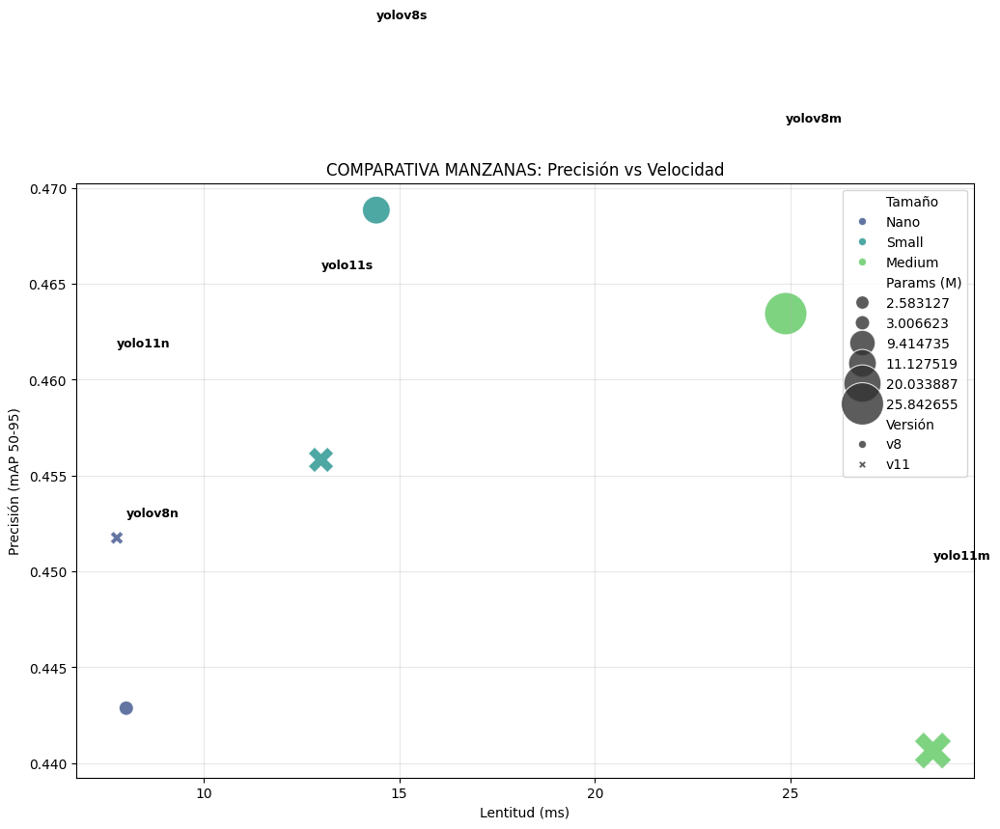

💾 Resultados guardados en 'benchmark_manzanas.csv'


In [20]:
import os
import shutil
import glob
import random
import yaml
import gc
import torch
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from ultralytics import YOLO

print("🤖 VcBot: Iniciando Benchmark Seguro para Manzanas...")

# ==========================================
# 1. CONFIGURACIÓN DE RUTAS (¡REVISA ESTO!)
# ==========================================
# Aquí debe estar tu dataset completo de manzanas (el que creamos antes)
ORIGINAL_DATASET_PATH = "/content/yolo_dataset_final"
MINI_DATASET_PATH = "/content/yolo_mini_benchmark_apples"

# Verificar si el original existe
if not os.path.exists(ORIGINAL_DATASET_PATH):
    print(f"❌ ERROR CRÍTICO: No encuentro el dataset en {ORIGINAL_DATASET_PATH}")
    print("   ¿Has ejecutado el paso de conversión a YOLO? Si tu dataset está en Drive, cambia la ruta arriba.")
    raise FileNotFoundError("Dataset original no encontrado")

# ==========================================
# 2. GENERAR MINI-DATASET (30%)
# ==========================================
print(f"\n✂️ Generando Mini-Dataset en {MINI_DATASET_PATH}...")

if os.path.exists(MINI_DATASET_PATH):
    shutil.rmtree(MINI_DATASET_PATH)

# Copiar 30% de datos
for split in ['train', 'val']:
    os.makedirs(f"{MINI_DATASET_PATH}/{split}/images", exist_ok=True)
    os.makedirs(f"{MINI_DATASET_PATH}/{split}/labels", exist_ok=True)

    # Buscar imágenes
    imgs = glob.glob(f"{ORIGINAL_DATASET_PATH}/{split}/images/*.jpg") + \
           glob.glob(f"{ORIGINAL_DATASET_PATH}/{split}/images/*.png")

    if len(imgs) > 0:
        subset = random.sample(imgs, max(10, int(len(imgs) * 0.3))) # 30% o mínimo 10
        for img_path in subset:
            # Copiar imagen
            shutil.copy(img_path, f"{MINI_DATASET_PATH}/{split}/images/")
            # Copiar label
            lbl_path = img_path.replace('images', 'labels').rsplit('.', 1)[0] + ".txt"
            if os.path.exists(lbl_path):
                shutil.copy(lbl_path, f"{MINI_DATASET_PATH}/{split}/labels/")
    else:
        print(f"⚠️ Advertencia: No hay imágenes en {split}")

# Crear data.yaml
with open(f"{ORIGINAL_DATASET_PATH}/data.yaml", 'r') as f:
    old_yaml = yaml.safe_load(f)

new_yaml = {
    'path': MINI_DATASET_PATH,
    'train': 'train/images',
    'val': 'val/images',
    'nc': old_yaml['nc'],
    'names': old_yaml['names']
}
with open(f"{MINI_DATASET_PATH}/data.yaml", 'w') as f:
    yaml.dump(new_yaml, f)

print("✅ Dataset reducido listo.")

# ==========================================
# 3. EL TORNEO (Con limpieza de memoria)
# ==========================================
models_to_test = [
    'yolov8n.pt', 'yolo11n.pt',  # Nano (Rápidos)
    'yolov8s.pt', 'yolo11s.pt',  # Small (Equilibrados)
    'yolov8m.pt', 'yolo11m.pt',  # Medium (Precisos)
    'yolov8l.pt', 'yolo11l.pt' # Large (Descomenta si tienes buena GPU, tardan mucho)
]

results_data = []
device = 0 if torch.cuda.is_available() else 'cpu'

print(f"\n🥊 Iniciando entrenamiento de {len(models_to_test)} modelos...")

for model_name in models_to_test:
    print(f"\n⚡ Procesando: {model_name}...")

    # --- LIMPIEZA DE MEMORIA (CRÍTICO) ---
    gc.collect()
    torch.cuda.empty_cache()
    # -------------------------------------

    try:
        model = YOLO(model_name)

        # Ajuste de batch automático
        bs = 16 if 'n.pt' in model_name or 's.pt' in model_name else 8

        # Entrenar
        model.train(
            data=f"{MINI_DATASET_PATH}/data.yaml",
            epochs=15,       # Bajamos a 15 para prueba rápida
            imgsz=640,
            batch=bs,
            device=device,
            project='benchmark_apples',
            name=model_name.replace('.pt', ''),
            verbose=False, plots=False
        )

        # Validar
        metrics = model.val(split='val', verbose=False)
        map50_95 = metrics.box.map
        speed = metrics.speed['inference'] + metrics.speed['preprocess'] + metrics.speed['loss']

        # Guardar params
        n_params = sum(p.numel() for p in model.parameters()) / 1e6

        results_data.append({
            'Modelo': model_name,
            'Tamaño': 'Nano' if 'n.pt' in model_name else ('Small' if 's.pt' in model_name else 'Medium'),
            'Versión': 'v11' if '11' in model_name else 'v8',
            'mAP50-95': map50_95,
            'Velocidad (ms)': speed,
            'Params (M)': n_params
        })
        print(f"   🆗 Resultado: mAP={map50_95:.3f} | Vel={speed:.1f}ms")

    except Exception as e:
        print(f"   ❌ Error en {model_name}: {e}")

# ==========================================
# 4. GRÁFICAS FINALES
# ==========================================
if len(results_data) > 0:
    df = pd.DataFrame(results_data)

    print("\n📊 TABLA FINAL:")
    print(df.sort_values(by='mAP50-95', ascending=False)[['Modelo', 'mAP50-95', 'Velocidad (ms)', 'Params (M)']])

    plt.figure(figsize=(12, 8))

    # Scatter Plot
    sns.scatterplot(
        data=df, x='Velocidad (ms)', y='mAP50-95',
        hue='Tamaño', style='Versión', size='Params (M)', sizes=(100, 1000),
        palette='viridis', alpha=0.8
    )

    # Etiquetas
    for i in range(df.shape[0]):
        plt.text(df['Velocidad (ms)'][i], df['mAP50-95'][i]+0.01,
                 df['Modelo'][i].replace('.pt',''), fontsize=9, weight='bold')

    plt.title("COMPARATIVA MANZANAS: Precisión vs Velocidad")
    plt.xlabel("Lentitud (ms)")
    plt.ylabel("Precisión (mAP 50-95)")
    plt.grid(True, alpha=0.3)
    plt.show()

    # Guardar CSV
    df.to_csv("benchmark_manzanas.csv", index=False)
    print("💾 Resultados guardados en 'benchmark_manzanas.csv'")
else:
    print("❌ No se obtuvieron resultados.")